# Project Description
Zomato Data Analysis is one of the most useful analysis for foodies who want to taste the best
cuisines of every part of the world which lies in their budget. This analysis is also for those who
want to find the value for money restaurants in various parts of the country for the cuisines.
Additionally, this analysis caters the needs of people who are striving to get the best cuisine of
the country and which locality of that country serves that cuisines with maximum number of
restaurants.

# Data Storage:
This problem statement contains two datasets- Zomato.csv and country_code.csv.
Country_code.csv contains two variables:
• Country code
• Country name

The collected data has been stored in the Comma Separated Value file Zomato.csv. Each
restaurant in the dataset is uniquely identified by its Restaurant Id. Every Restaurant contains the following variables:
• Restaurant Id: Unique id of every restaurant across various cities of the world
• Restaurant Name: Name of the restaurant
• Country Code: Country in which restaurant is located
• City: City in which restaurant is located
• Address: Address of the restaurant
• Locality: Location in the city
• Locality Verbose: Detailed description of the locality
• Longitude: Longitude coordinate of the restaurant&#39;s location
• Latitude: Latitude coordinate of the restaurant&#39;s location
• Cuisines: Cuisines offered by the restaurant
• Average Cost for two: Cost for two people in different currencies ��
• Currency: Currency of the country
• Has Table booking: yes/no
• Has Online delivery: yes/ no
• Is delivering: yes/ no
• Switch to order menu: yes/no
• Price range: range of price of food
• Aggregate Rating: Average rating out of 5
• Rating color: depending upon the average rating color
• Rating text: text on the basis of rating of rating
• Votes: Number of ratings casted by people

# Problem statement : In this dataset predict 2 things –
1) Average Cost for two
2) Price range


# Hint : Use pandas merge operation -- pd.merge (df1,df2) to combine two datasets


# Dataset Link-  
•	https://github.com/dsrscientist/dataset4/blob/main/Country-Code.xlsx
•	https://github.com/dsrscientist/dataset4/blob/main/zomato.csv


In [1]:
# Imp libs:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Spliting data
from sklearn.model_selection import train_test_split,GridSearchCV


# Standardizing and Normalizing data:
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LinearRegression
import xgboost as xgb

from sklearn import linear_model
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
import itertools
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.naive_bayes import GaussianNB
# Importing metrics
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

from statsmodels.stats.outliers_influence import variance_inflation_factor

# Spliting data
from sklearn.model_selection import train_test_split,GridSearchCV

# Importing metrics
from sklearn import metrics
from sklearn.metrics import r2_score,mean_squared_error

# Removing warnings
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [2]:
import pandas as pd

# Data Loading with a different encoding
url_zomato = "https://raw.githubusercontent.com/dsrscientist/dataset4/main/zomato.csv"
df1 = pd.read_csv(url_zomato, encoding='latin-1')

url_country_code = "https://raw.githubusercontent.com/dsrscientist/dataset4/main/Country-Code.xlsx"
df2 = pd.read_excel(url_country_code)


In [3]:
# Try different encodings if one doesn't work
try_encodings = ['utf-8', 'utf-8-sig', 'latin-1', 'ISO-8859-1', 'cp1252']


In [4]:
for encoding in try_encodings:
    try:
        zomato_df = pd.read_csv(url_zomato, encoding=encoding)
        break  # Stop if successful
    except UnicodeDecodeError:
        continue  # Try the next encoding

country_code_df = pd.read_excel(url_country_code)


In [5]:
# Load the country_code_df directly since it is an Excel file
country_code_df = pd.read_excel(url_country_code)

In [6]:
# Data Merging
merged_df = pd.merge(zomato_df, country_code_df, on='Country Code', how='left')

In [7]:
# Initial Data Analysis
print(merged_df.head())

   Restaurant ID         Restaurant Name  Country Code              City  \
0        6317637        Le Petit Souffle           162       Makati City   
1        6304287        Izakaya Kikufuji           162       Makati City   
2        6300002  Heat - Edsa Shangri-La           162  Mandaluyong City   
3        6318506                    Ooma           162  Mandaluyong City   
4        6314302             Sambo Kojin           162  Mandaluyong City   

                                             Address  \
0  Third Floor, Century City Mall, Kalayaan Avenu...   
1  Little Tokyo, 2277 Chino Roces Avenue, Legaspi...   
2  Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...   
3  Third Floor, Mega Fashion Hall, SM Megamall, O...   
4  Third Floor, Mega Atrium, SM Megamall, Ortigas...   

                                     Locality  \
0   Century City Mall, Poblacion, Makati City   
1  Little Tokyo, Legaspi Village, Makati City   
2  Edsa Shangri-La, Ortigas, Mandaluyong City   
3      SM 

In [8]:
print(merged_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [9]:
# Select continuous and categorical columns
cont_data = merged_df.select_dtypes(include=['int64', 'float64'])
cat_data = merged_df.select_dtypes(include=['object'])

In [10]:
# Summary statistics for all columns
desc = merged_df.describe().T

In [11]:
# Compute the range for each column
desc['range'] = desc['max'] - desc['min']
print(desc)

                       count          mean           std         min  \
Restaurant ID         9551.0  9.051128e+06  8.791521e+06   53.000000   
Country Code          9551.0  1.836562e+01  5.675055e+01    1.000000   
Longitude             9551.0  6.412657e+01  4.146706e+01 -157.948486   
Latitude              9551.0  2.585438e+01  1.100794e+01  -41.330428   
Average Cost for two  9551.0  1.199211e+03  1.612118e+04    0.000000   
Price range           9551.0  1.804837e+00  9.056088e-01    1.000000   
Aggregate rating      9551.0  2.666370e+00  1.516378e+00    0.000000   
Votes                 9551.0  1.569097e+02  4.301691e+02    0.000000   

                                25%           50%           75%           max  \
Restaurant ID         301962.500000  6.004089e+06  1.835229e+07  1.850065e+07   
Country Code               1.000000  1.000000e+00  1.000000e+00  2.160000e+02   
Longitude                 77.081343  7.719196e+01  7.728201e+01  1.748321e+02   
Latitude                  2

In [12]:
# Feature Engineering

location_specific_details = ['Country Code', 'Country', 'Currency', 'Restaurant ID', 'Restaurant Name', 'City',
       'Address', 'Locality', 'Locality Verbose', 'Longitude', 'Latitude']

restaurant_details = ['Cuisines', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu']

ratings = ['Aggregate rating', 'Rating color', 'Rating text',
       'Votes']

labels = ['Average Cost for two','Price range']

In [13]:
# Select continuous and categorical columns
cont_data = merged_df.select_dtypes(include=['int64', 'float64'])
cat_data = merged_df.select_dtypes(include=['object'])

# Get continuous column names
cont_columns = cont_data.columns
print("Continuous Columns:", cont_columns)

# Get categorical column names
cat_columns = cat_data.columns
print("Categorical Columns:", cat_columns)

Continuous Columns: Index(['Restaurant ID', 'Country Code', 'Longitude', 'Latitude',
       'Average Cost for two', 'Price range', 'Aggregate rating', 'Votes'],
      dtype='object')
Categorical Columns: Index(['Restaurant Name', 'City', 'Address', 'Locality', 'Locality Verbose',
       'Cuisines', 'Currency', 'Has Table booking', 'Has Online delivery',
       'Is delivering now', 'Switch to order menu', 'Rating color',
       'Rating text', 'Country'],
      dtype='object')


In [14]:
!pip install scipy

In [15]:
# Find the unique values and counts for each categorical column
for i in cat_columns:
    unique_values = merged_df[i].unique()
    print('For column', i, 'unique values are:', unique_values, '\n\n')
    print('For column', i, 'count of unique values is:', merged_df[i].nunique(), '\n\n')

For column Restaurant Name unique values are: ['Le Petit Souffle' 'Izakaya Kikufuji' 'Heat - Edsa Shangri-La' ...
 'Huqqa' 'A\x81ô\x81ôk Kahve' "Walter's Coffee Roastery"] 


For column Restaurant Name count of unique values is: 7446 


For column City unique values are: ['Makati City' 'Mandaluyong City' 'Pasay City' 'Pasig City' 'Quezon City'
 'San Juan City' 'Santa Rosa' 'Tagaytay City' 'Taguig City' 'Brasí_lia'
 'Rio de Janeiro' 'Sí£o Paulo' 'Albany' 'Armidale' 'Athens' 'Augusta'
 'Balingup' 'Beechworth' 'Boise' 'Cedar Rapids/Iowa City' 'Chatham-Kent'
 'Clatskanie' 'Cochrane' 'Columbus' 'Consort' 'Dalton' 'Davenport'
 'Des Moines' 'Dicky Beach' 'Dubuque' 'East Ballina' 'Fernley' 'Flaxton'
 'Forrest' 'Gainesville' 'Hepburn Springs' 'Huskisson' 'Inverloch'
 'Lakes Entrance' 'Lakeview' 'Lincoln' 'Lorn' 'Macedon' 'Macon' 'Mayfield'
 'Mc Millan' 'Middleton Beach' 'Miller' 'Monroe' 'Montville'
 'Ojo Caliente' 'Orlando' 'Palm Cove' 'Paynesville' 'Penola' 'Pensacola'
 'Phillip Island' 'Poca

In [16]:
# Access column names of the merged DataFrame
columns_list = merged_df.columns.tolist()
print("Column Names of the Merged DataFrame:")
print(columns_list)

Column Names of the Merged DataFrame:
['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address', 'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines', 'Average Cost for two', 'Currency', 'Has Table booking', 'Has Online delivery', 'Is delivering now', 'Switch to order menu', 'Price range', 'Aggregate rating', 'Rating color', 'Rating text', 'Votes', 'Country']


# Grouped data analytics:

# EXPLORATORY DATA ANALYSIS¶


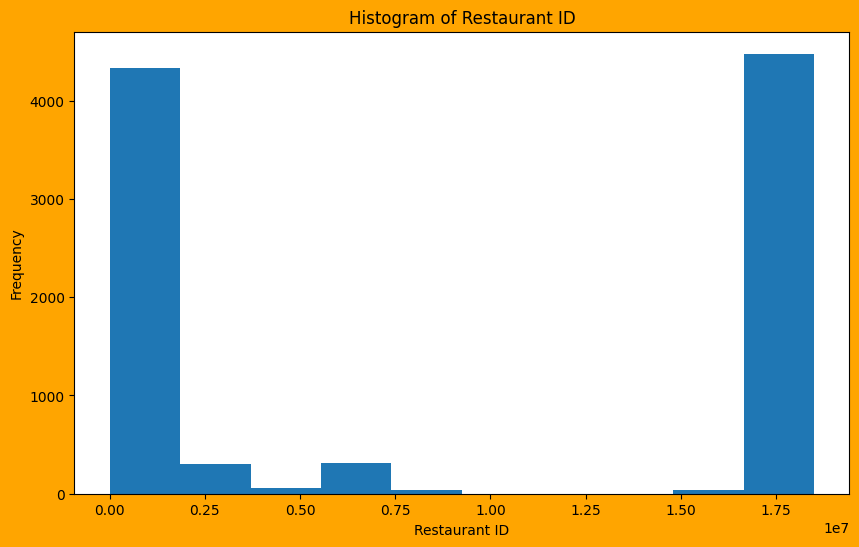

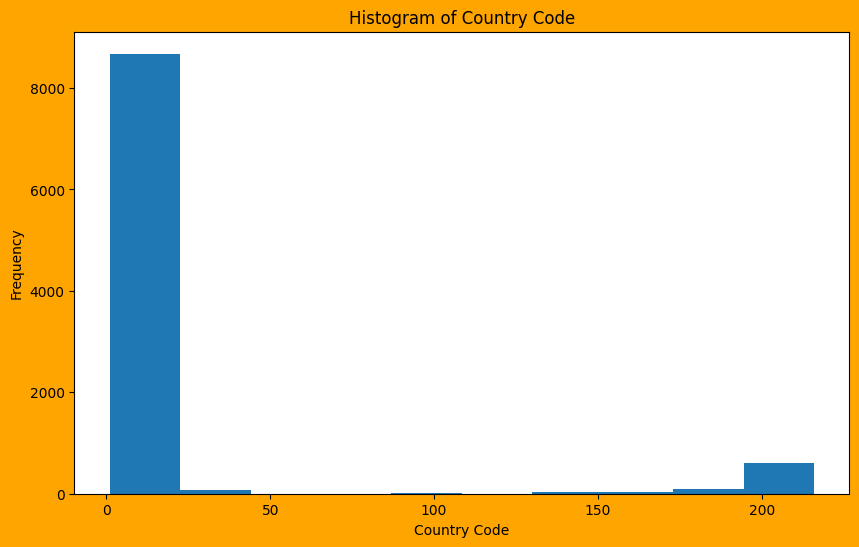

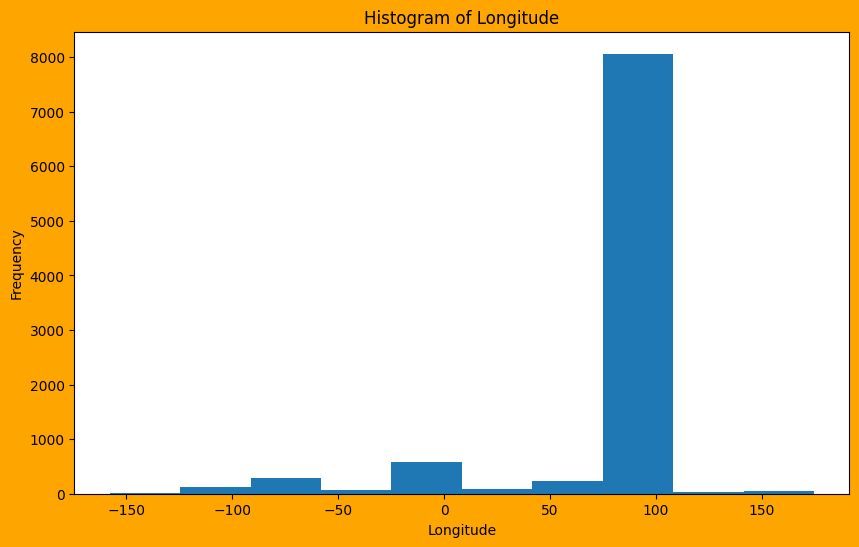

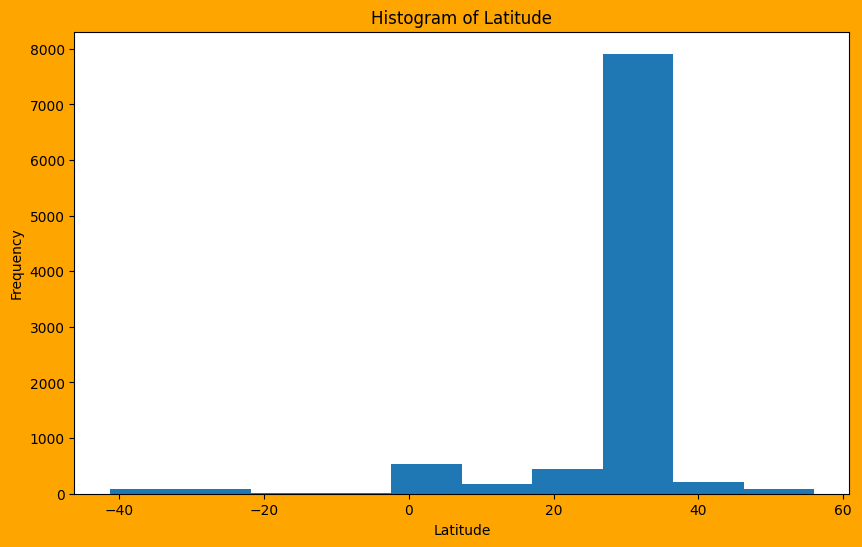

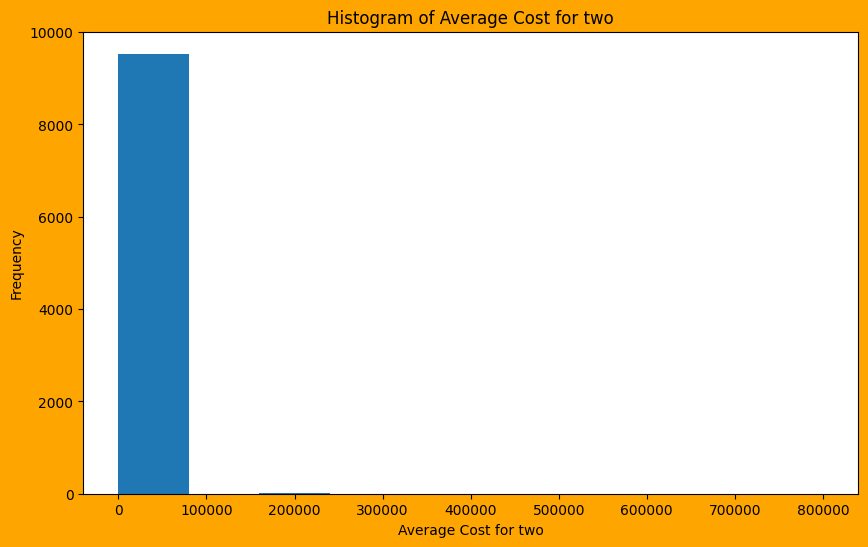

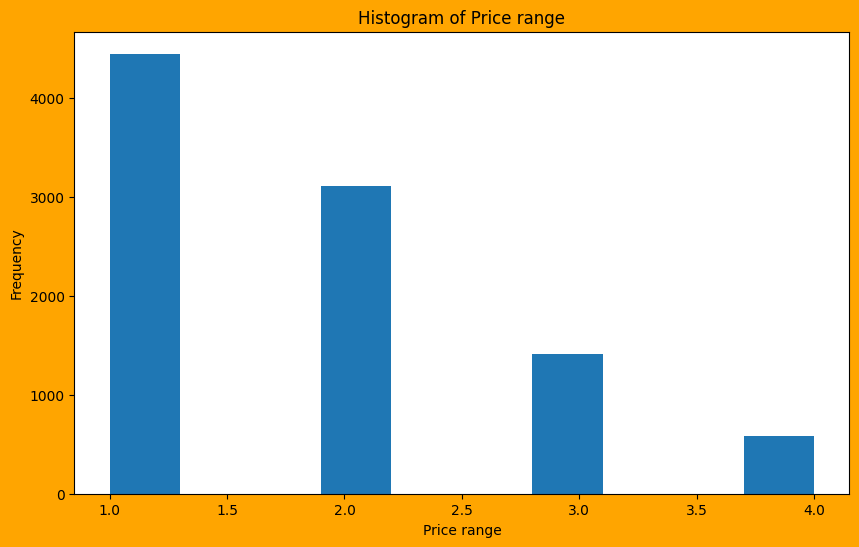

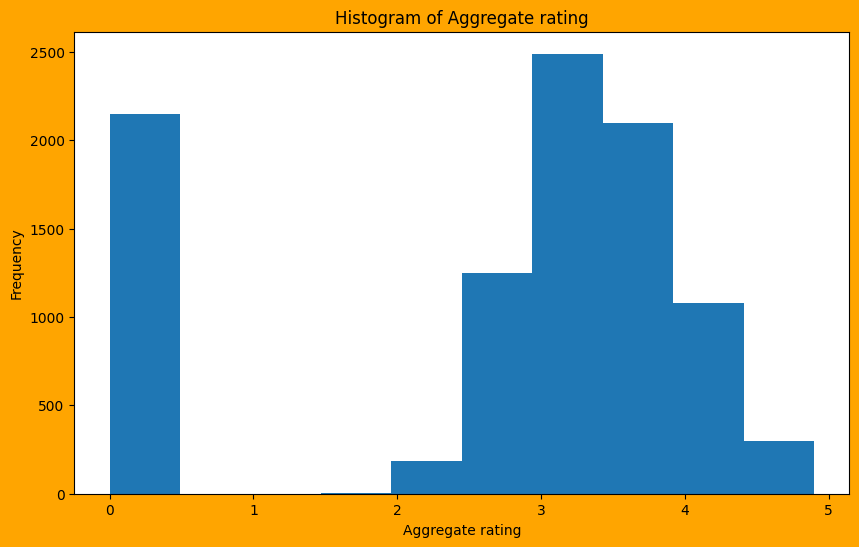

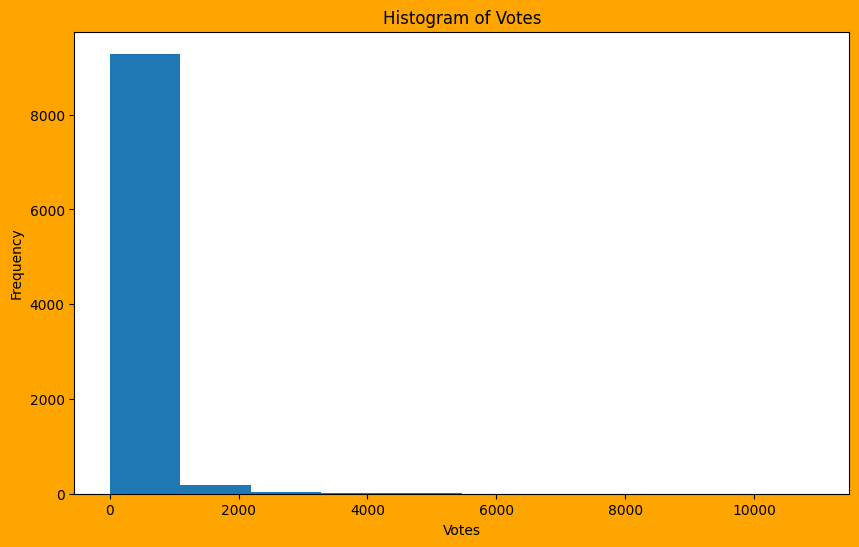

In [17]:
# Create histograms for each continuous column
for i in cont_columns:
    plt.figure(figsize=(10, 6), facecolor='orange')
    plt.hist(merged_df[i], bins=10)
    plt.xlabel(i)
    plt.ylabel("Frequency")
    plt.title(f"Histogram of {i}")
    plt.show()

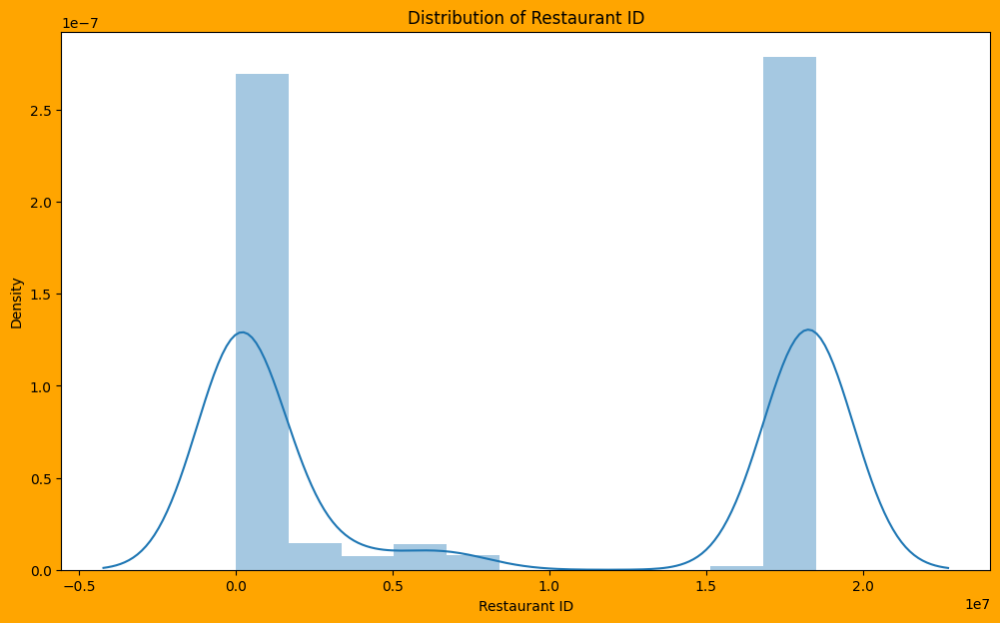

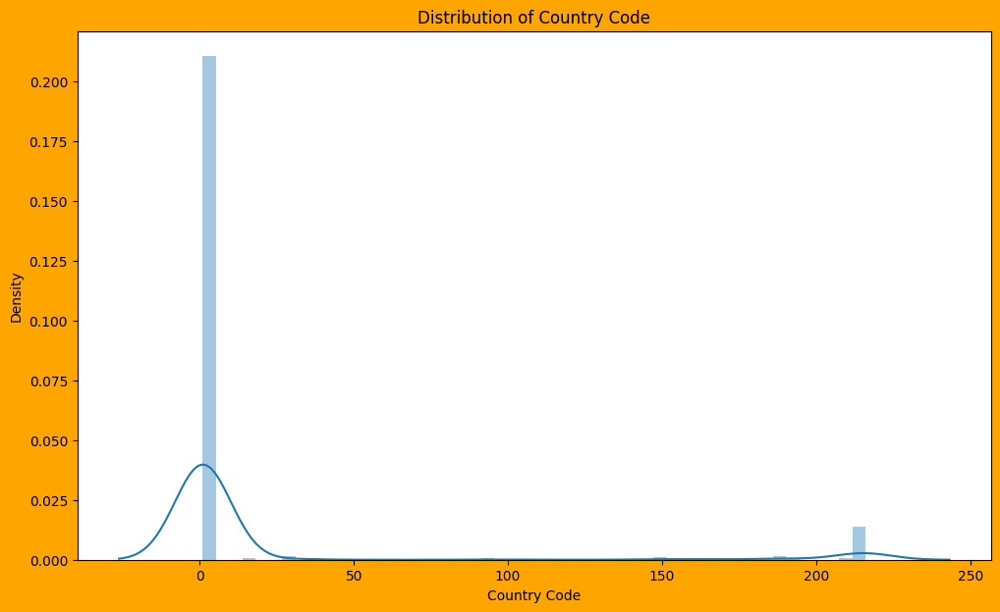

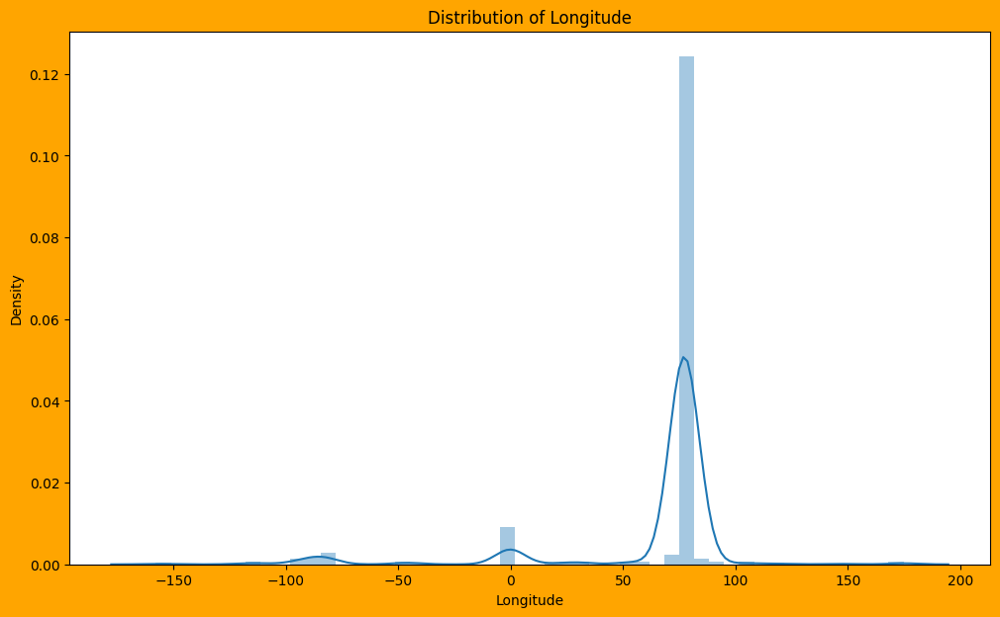

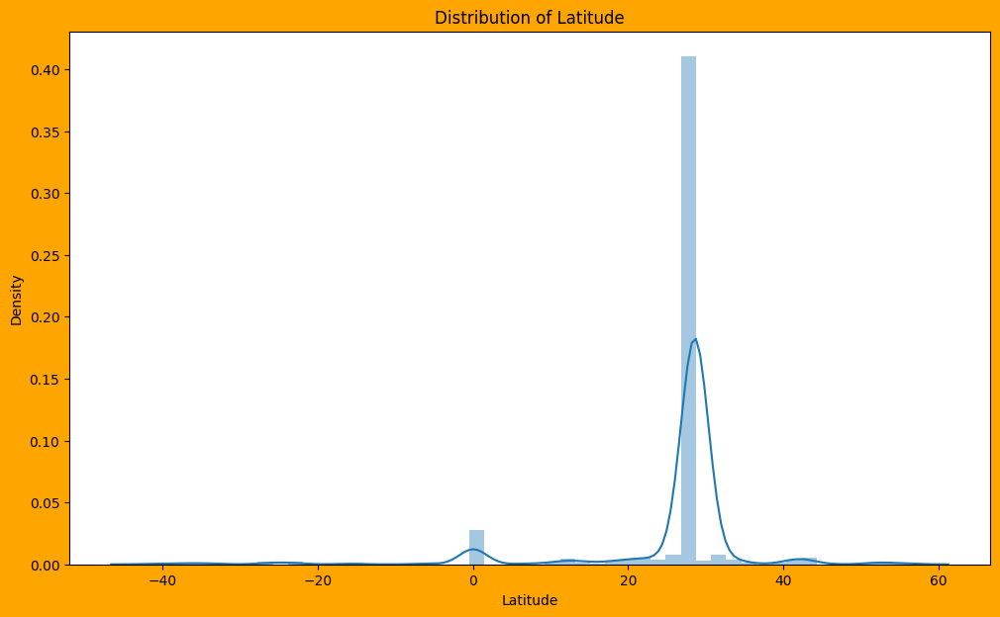

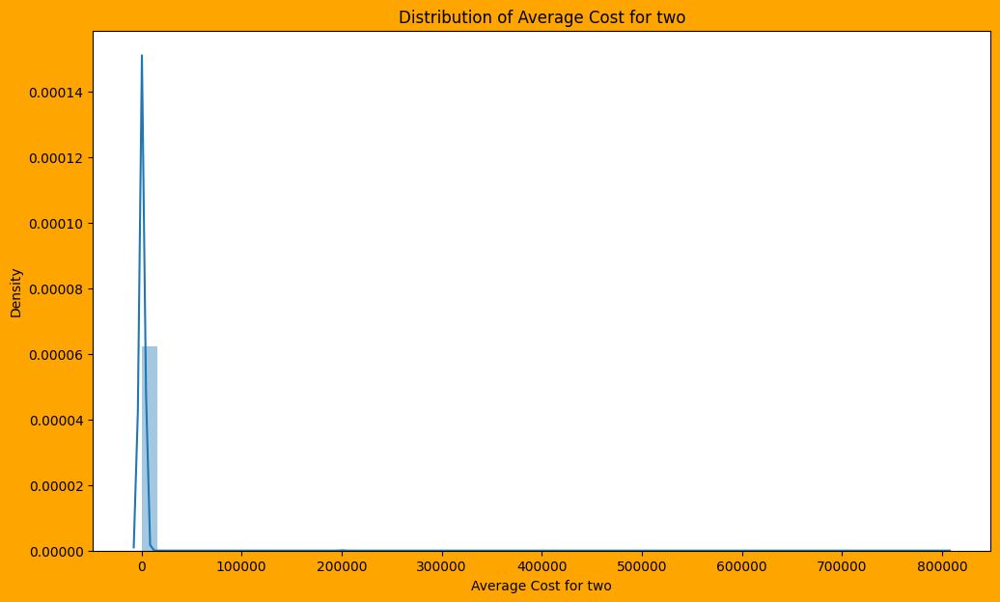

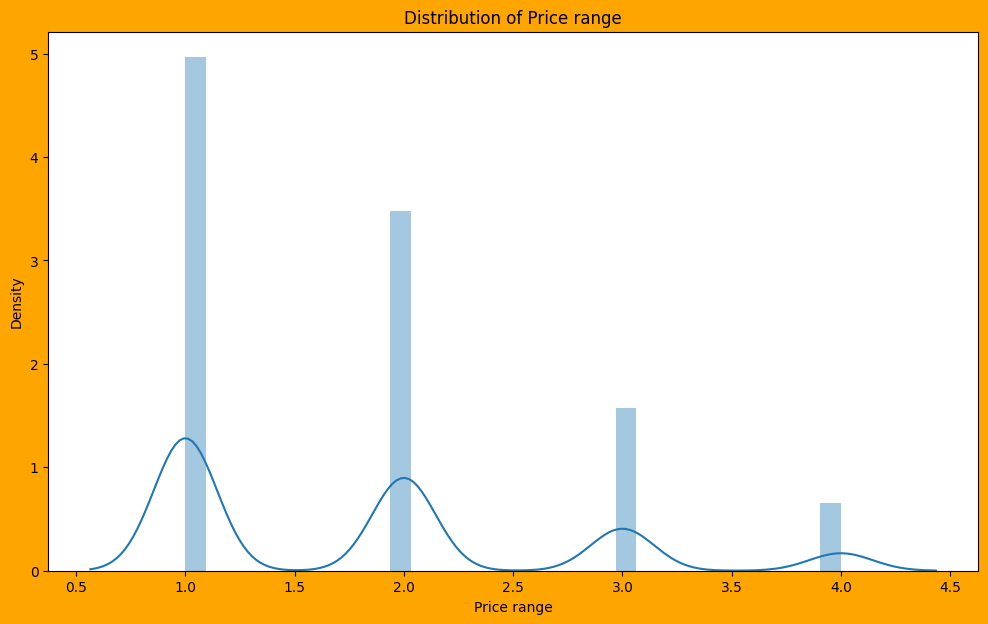

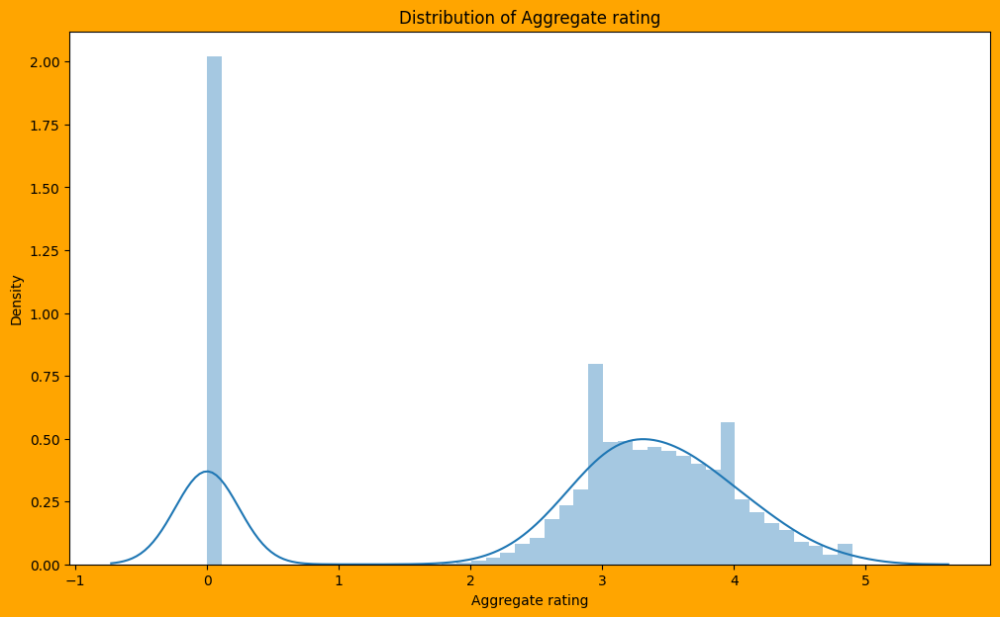

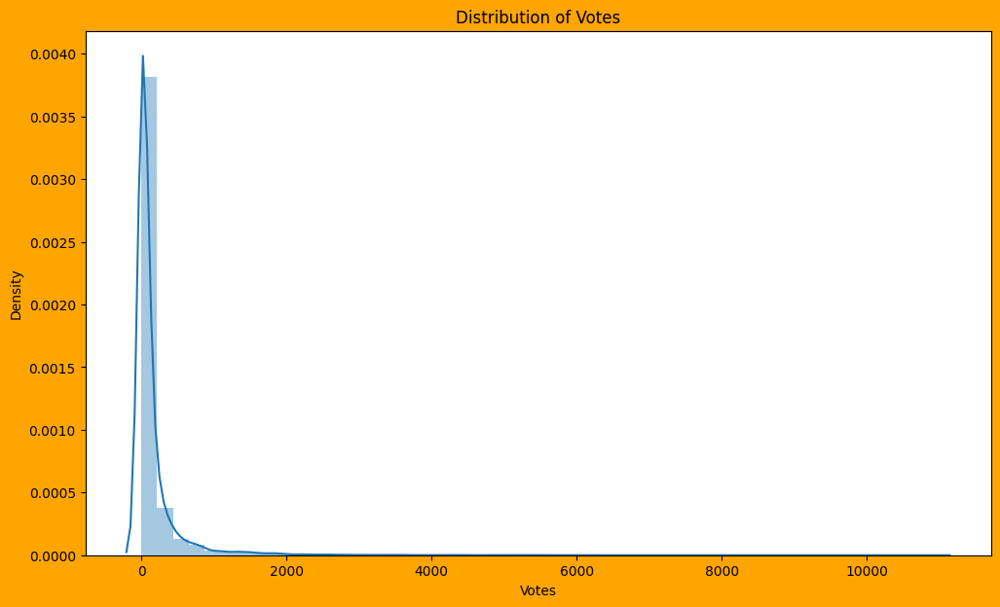

In [18]:
# Create distribution plots for each continuous column
for i in cont_columns:
    plt.figure(figsize=(12, 7), facecolor='orange')
    sns.distplot(merged_df[i])
    plt.xlabel(i)
    plt.ylabel("Density")
    plt.title(f"Distribution of {i}")
    plt.show()

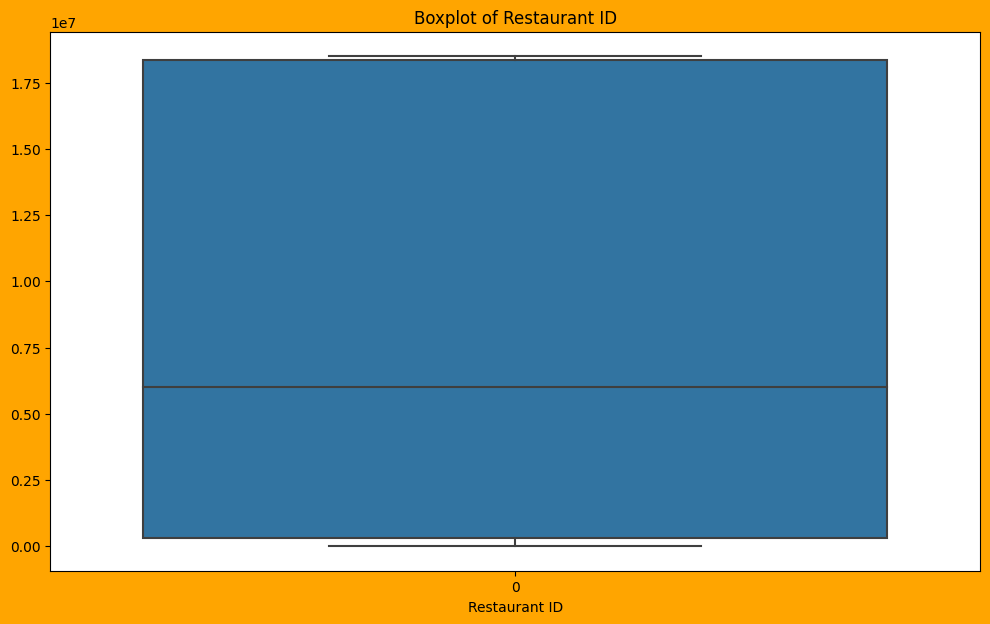

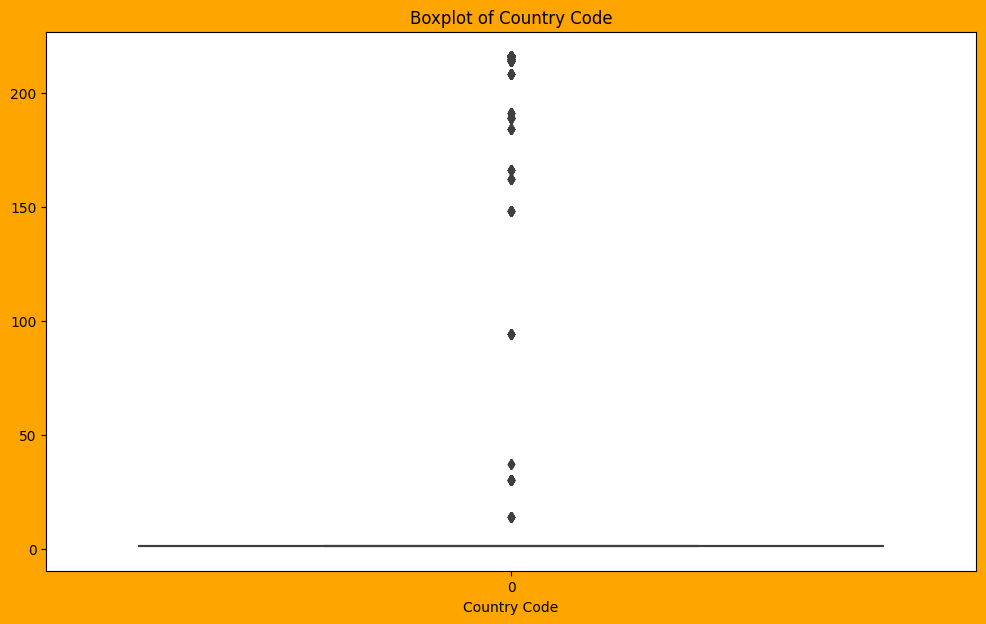

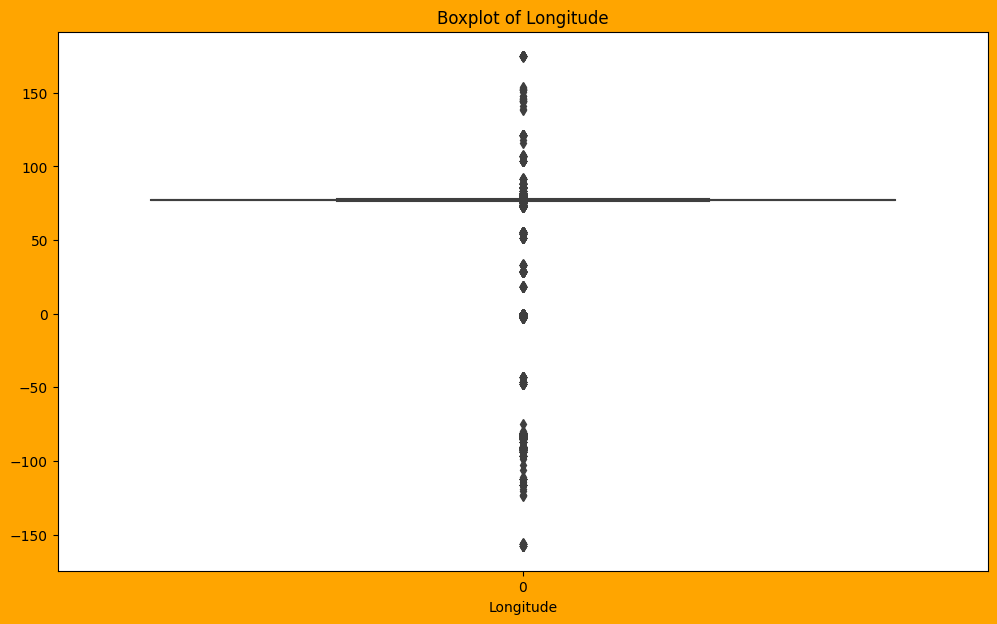

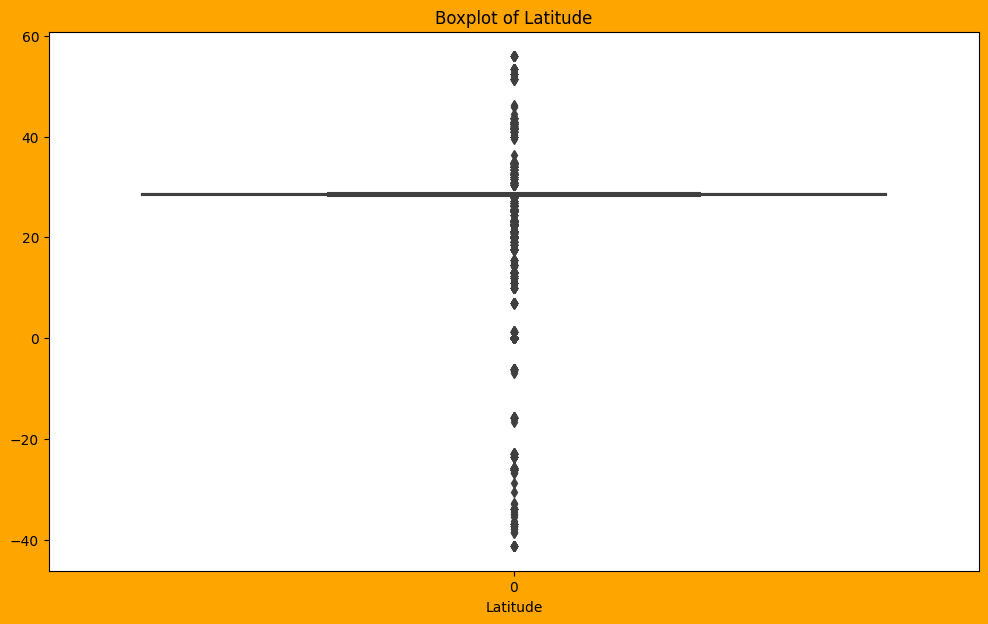

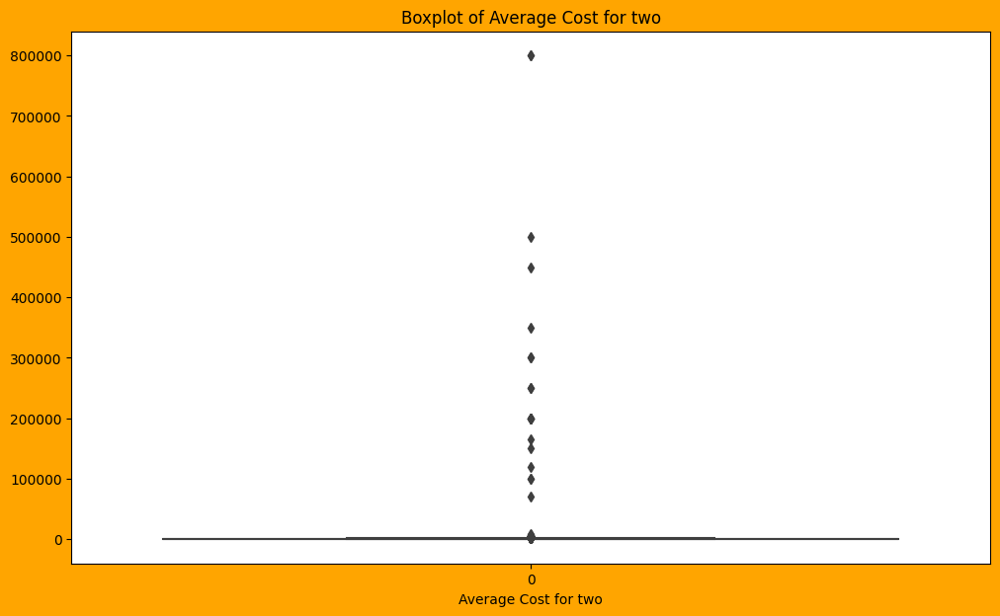

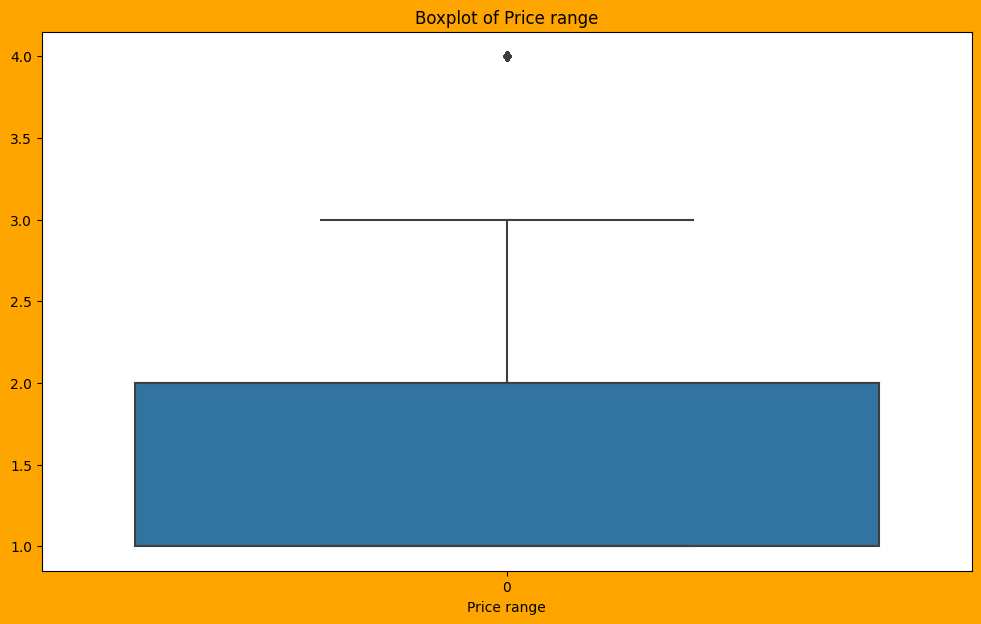

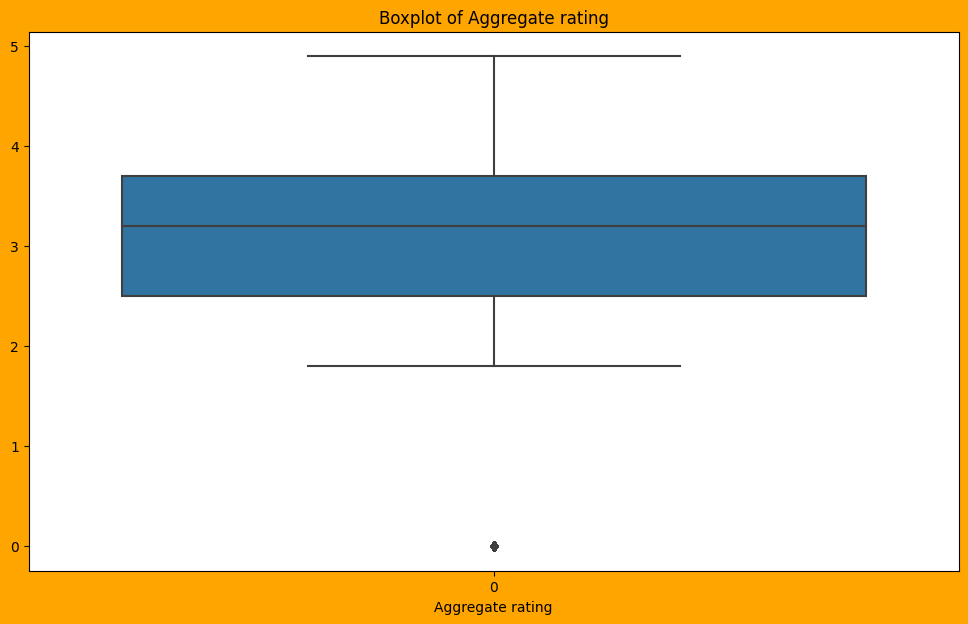

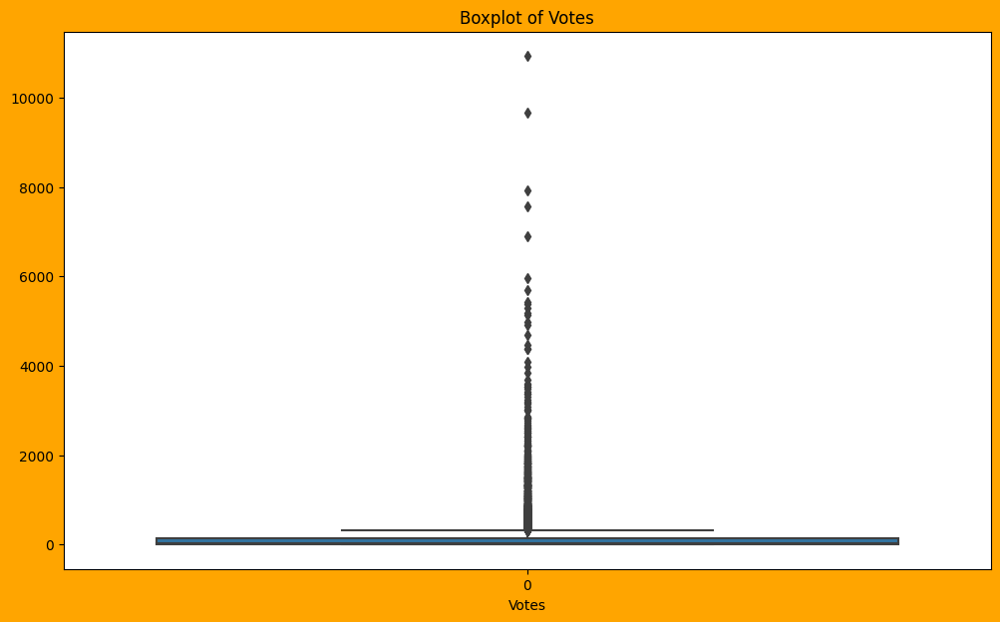

In [19]:
# Create boxplots for each continuous column
for i in cont_columns:
    plt.figure(figsize=(12, 7), facecolor='orange')
    sns.boxplot(merged_df[i])
    plt.xlabel(i)
    plt.title(f"Boxplot of {i}")
    plt.show()

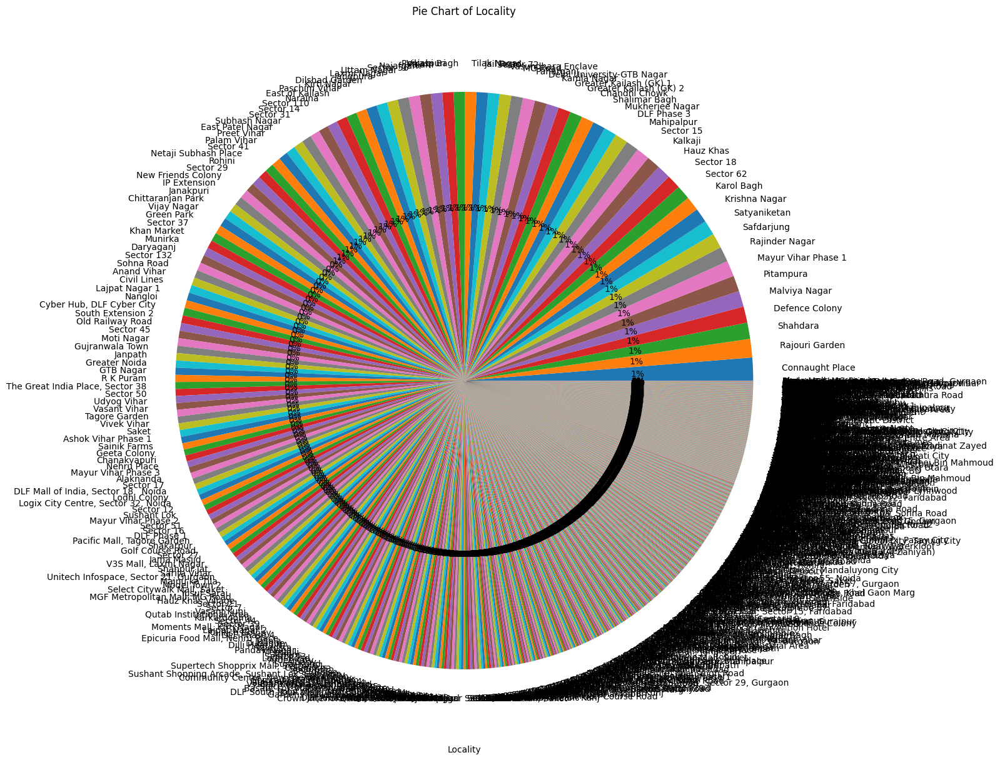

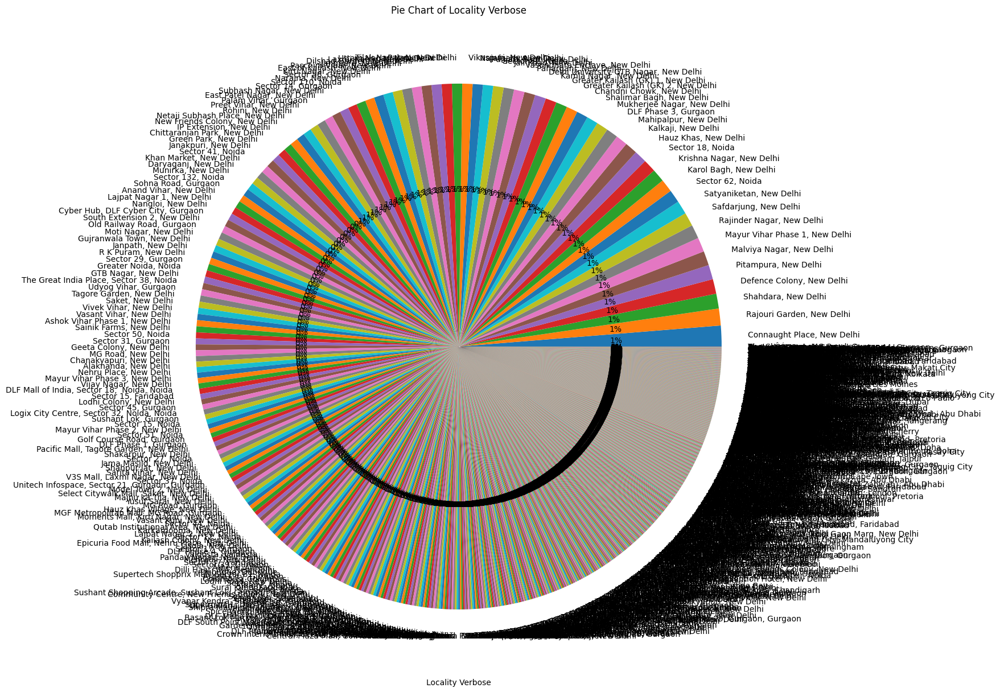

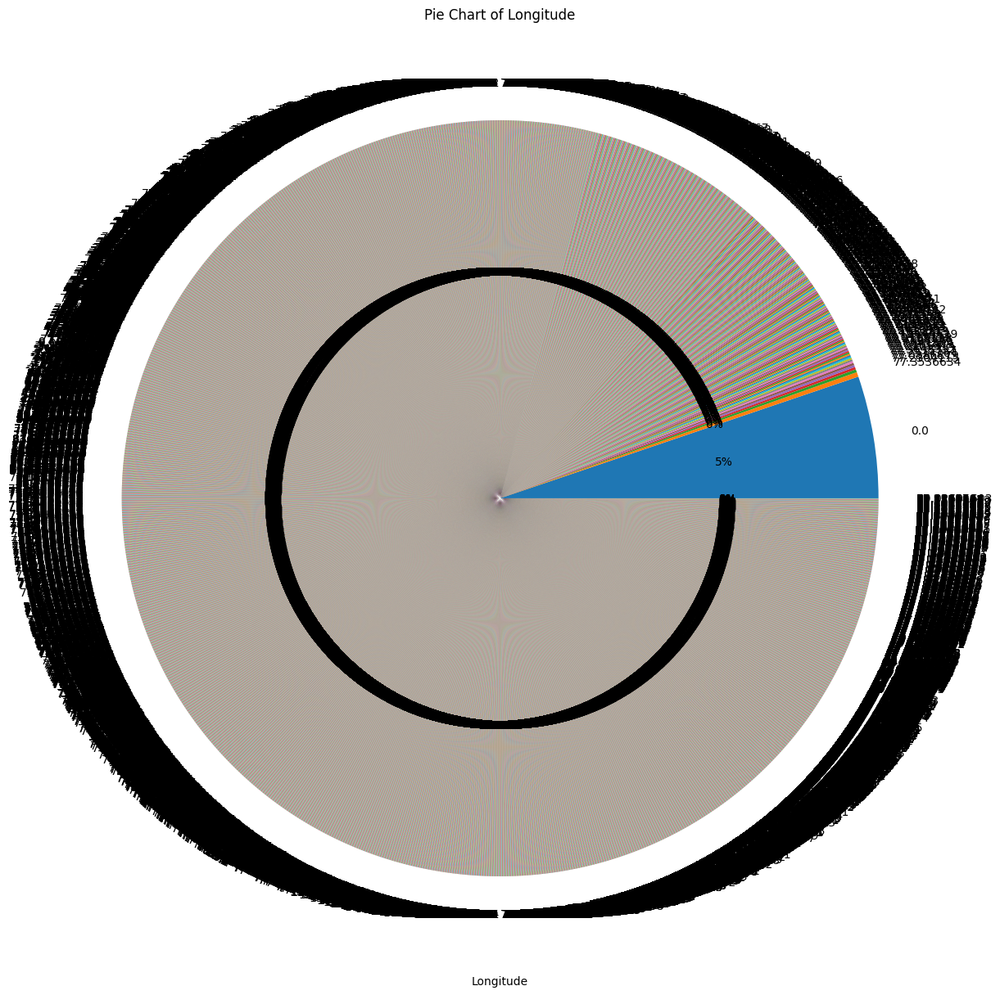

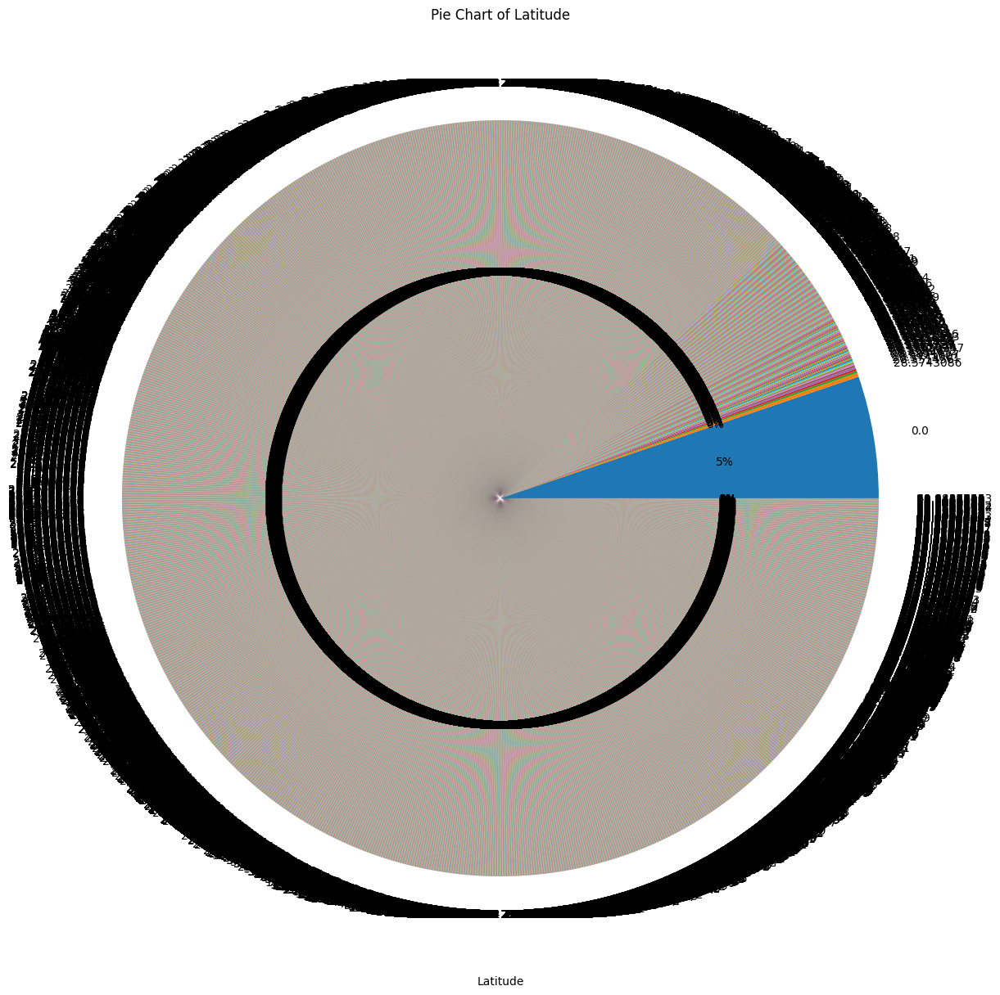

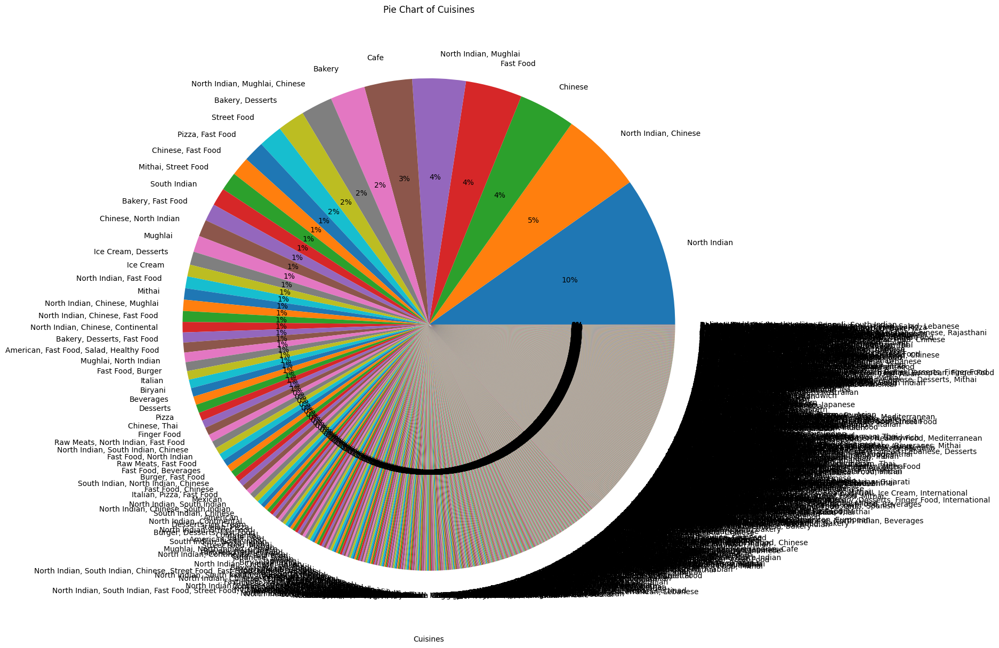

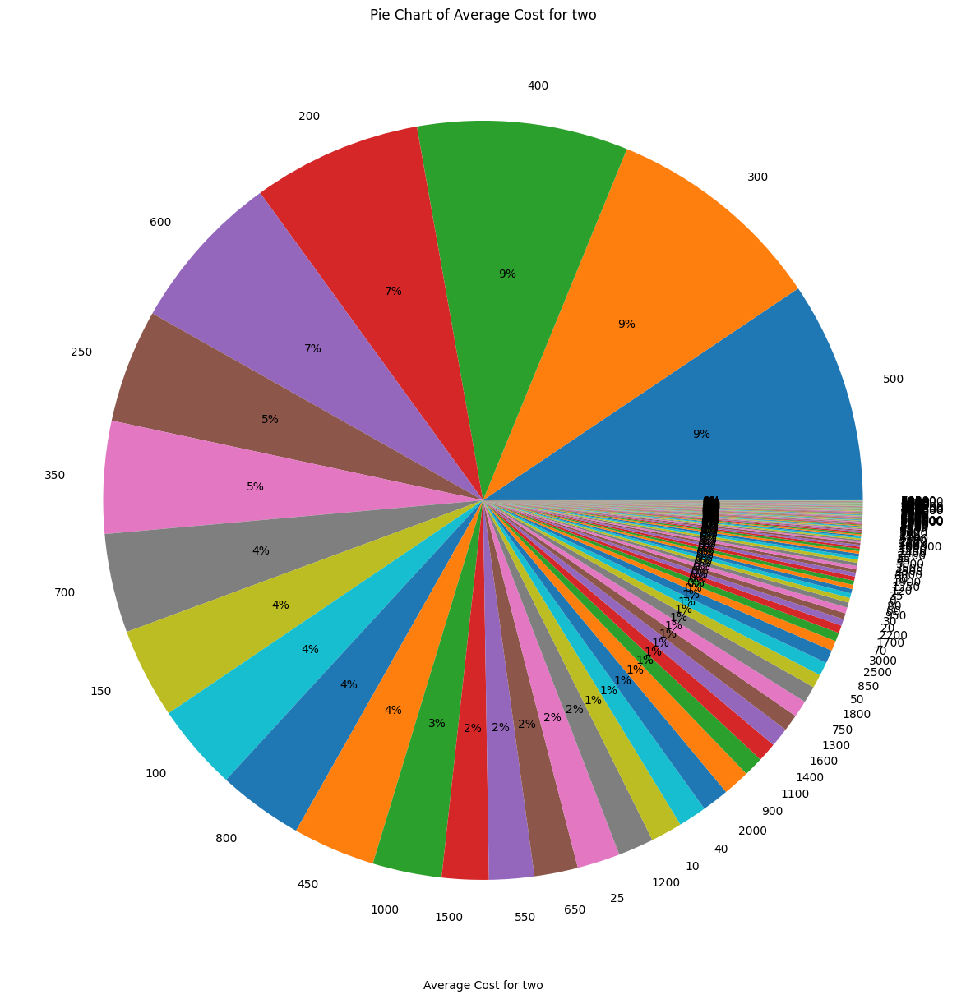

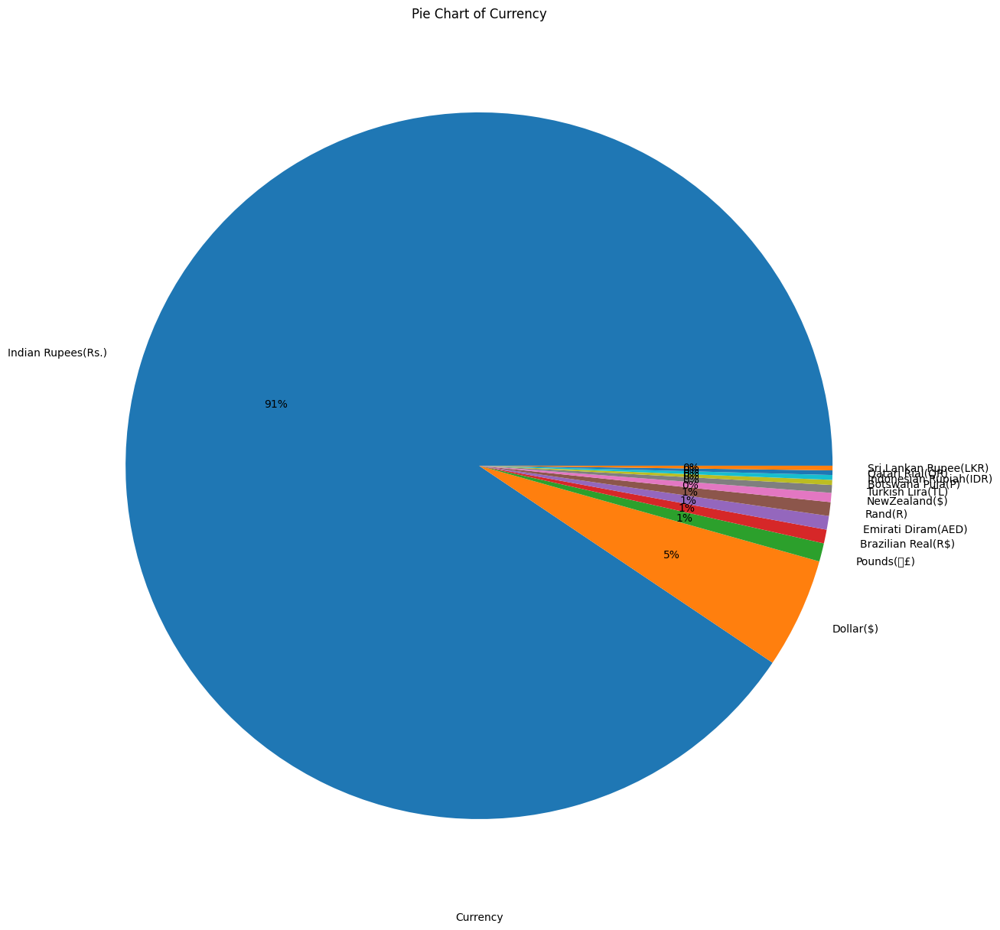

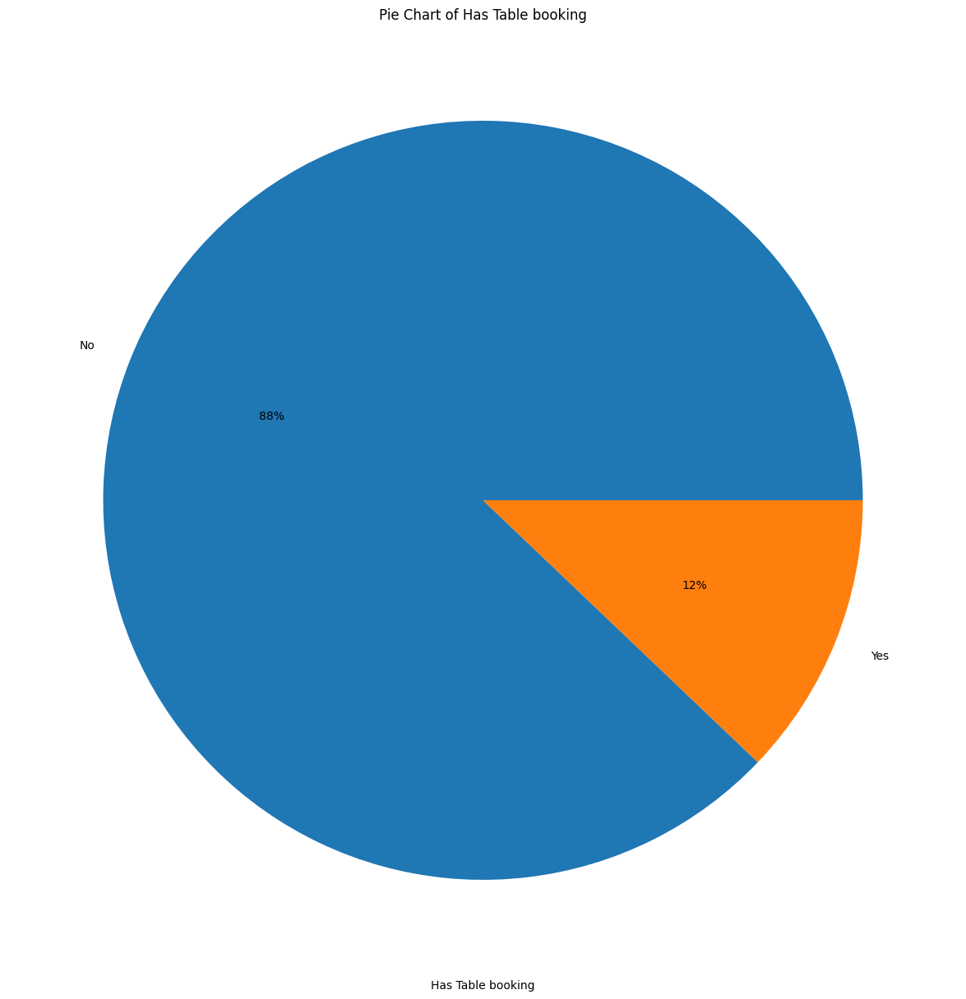

In [20]:
# Create pie charts for the selected categorical columns
selected_cat_columns = ['Locality', 'Locality Verbose', 'Longitude', 'Latitude',
                        'Cuisines', 'Average Cost for two', 'Currency', 'Has Table booking']

for i in selected_cat_columns:
    plt.figure(figsize=(15, 15))
    plt.pie(merged_df[i].value_counts().values, labels=merged_df[i].value_counts().index, autopct='%.0f%%')
    plt.xlabel(i)
    plt.title(f"Pie Chart of {i}")
    plt.show()

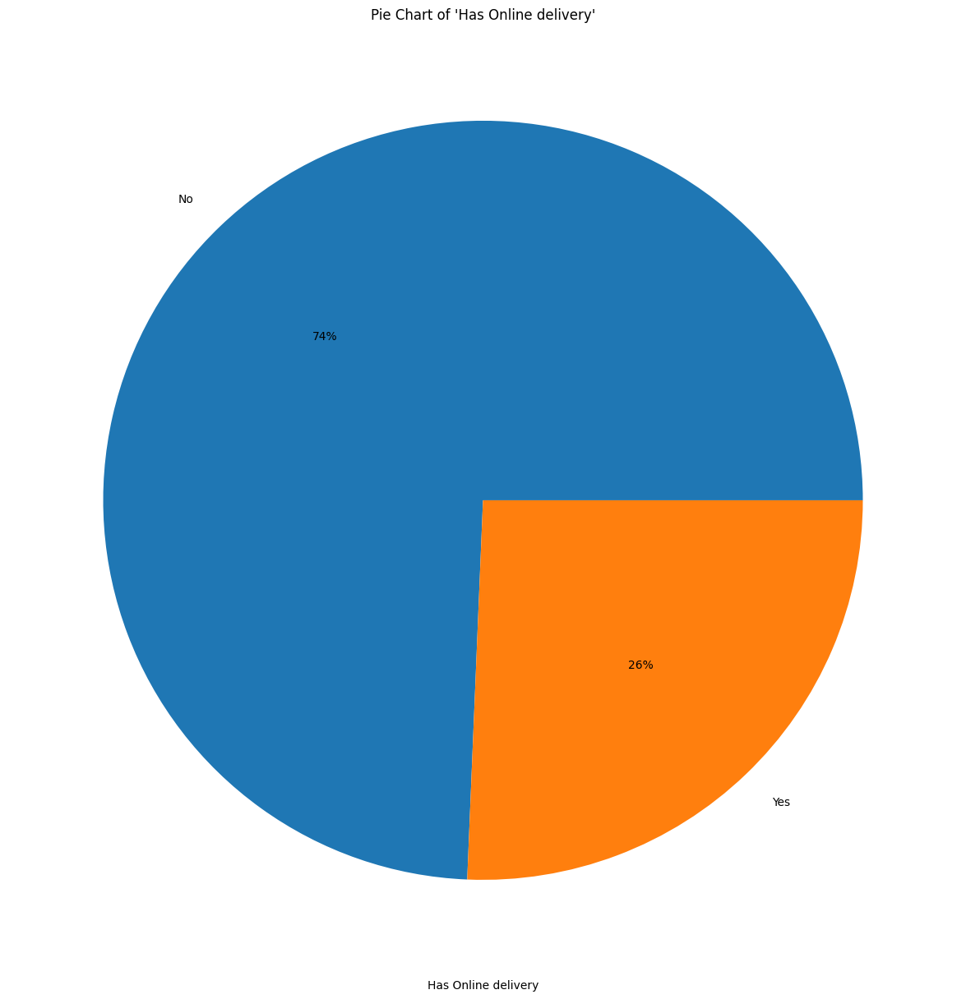

In [21]:
# Create a pie chart for the 'Has Online delivery' column
plt.figure(figsize=(15, 15))
plt.pie(merged_df['Has Online delivery'].value_counts().values, labels=merged_df['Has Online delivery'].value_counts().index, autopct='%.0f%%')
plt.xlabel('Has Online delivery')
plt.title("Pie Chart of 'Has Online delivery'")
plt.show()

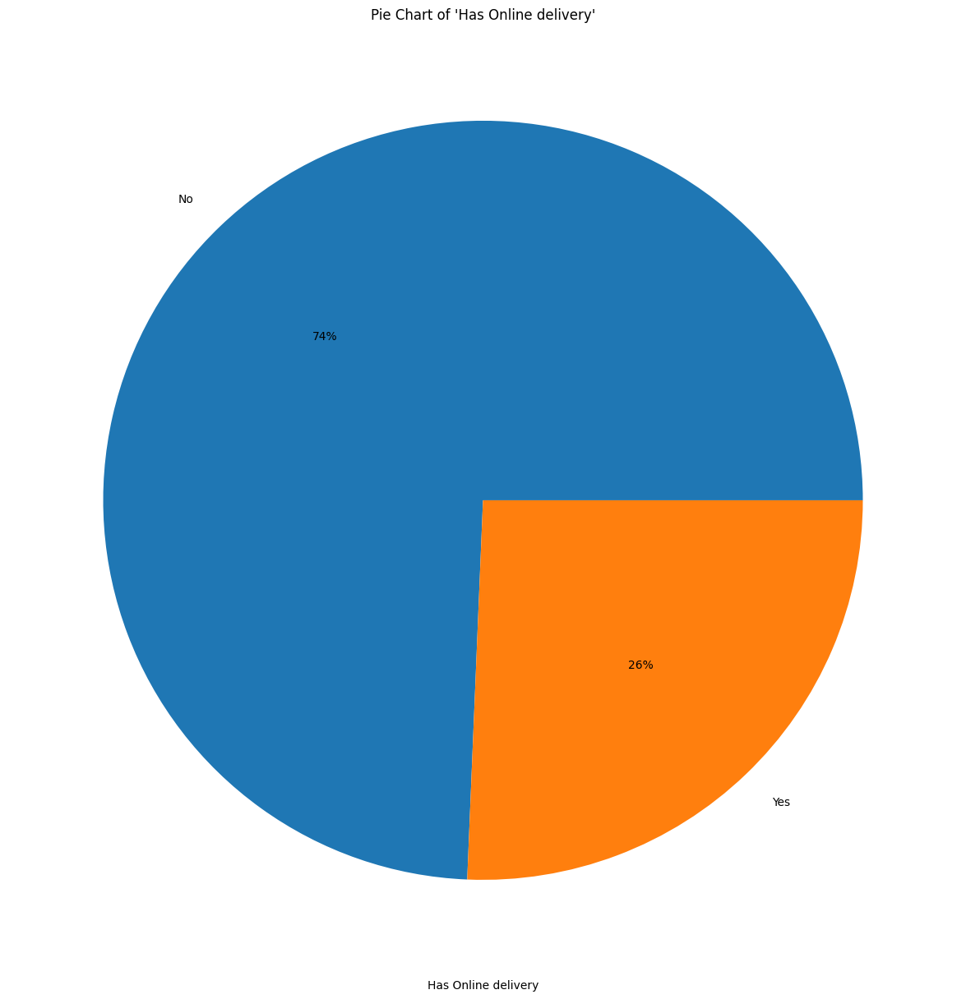

In [22]:
# Create a pie chart for the 'Has Online delivery' column
plt.figure(figsize=(15, 15))
plt.pie(merged_df['Has Online delivery'].value_counts().values, labels=merged_df['Has Online delivery'].value_counts().index, autopct='%.0f%%')
plt.xlabel('Has Online delivery')
plt.title("Pie Chart of 'Has Online delivery'")
plt.show()

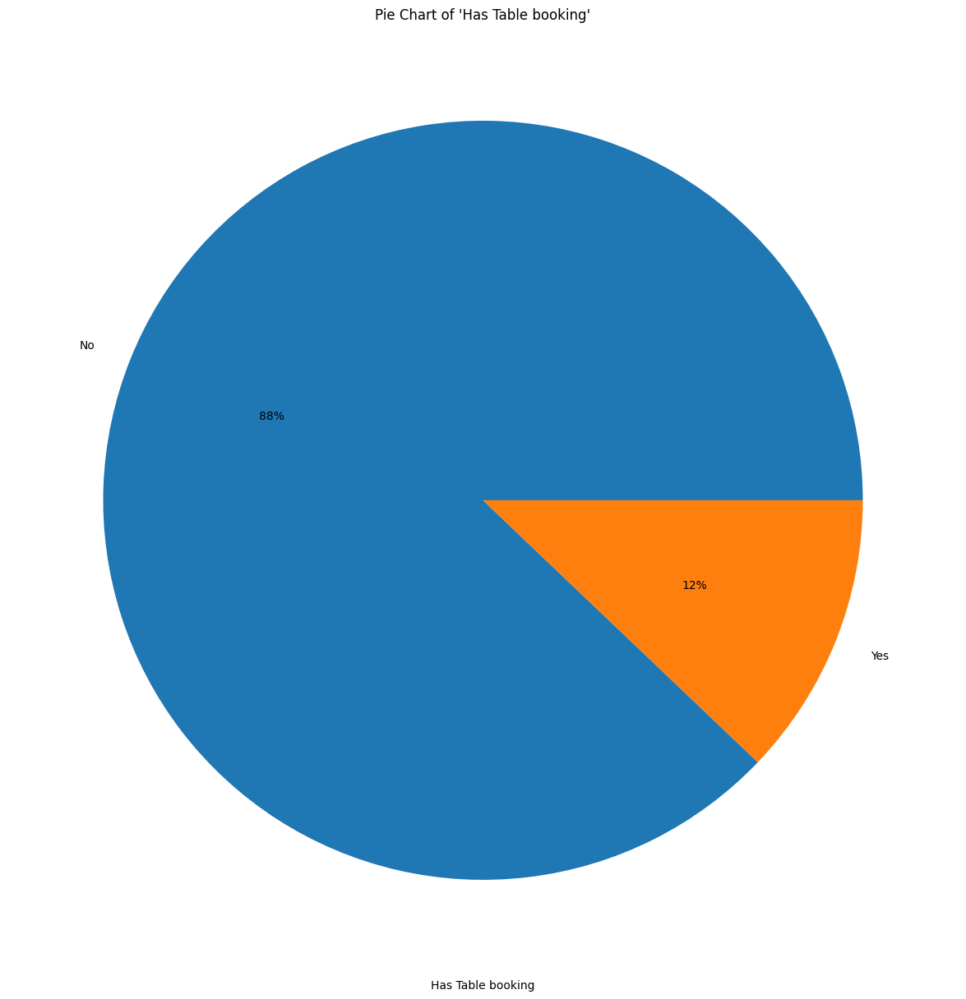

In [23]:
# Create a pie chart for the 'Has Table booking' column
plt.figure(figsize=(15, 15))
plt.pie(merged_df['Has Table booking'].value_counts().values, labels=merged_df['Has Table booking'].value_counts().index, autopct='%.0f%%')
plt.xlabel('Has Table booking')
plt.title("Pie Chart of 'Has Table booking'")
plt.show()

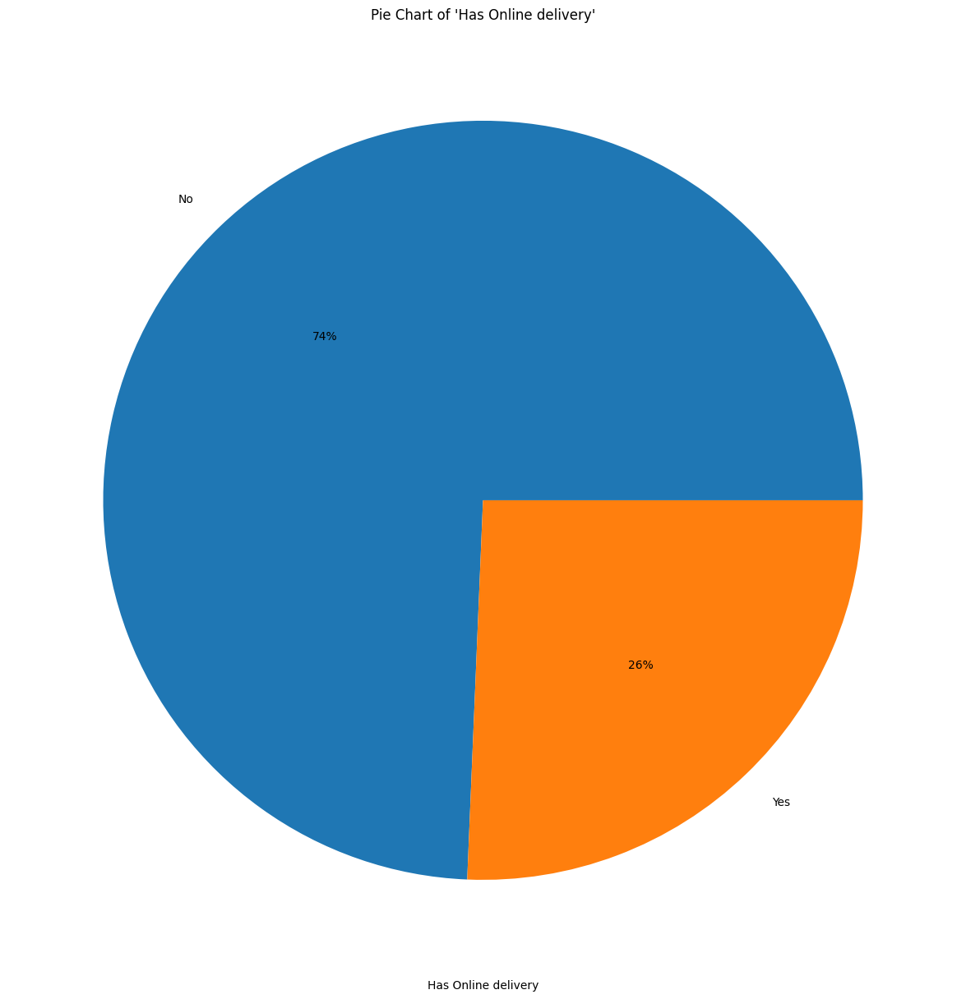

In [24]:
# Create a pie chart for the 'Has Online delivery' column
plt.figure(figsize=(15, 15))
plt.pie(merged_df['Has Online delivery'].value_counts().values, labels=merged_df['Has Online delivery'].value_counts().index, autopct='%.0f%%')
plt.xlabel('Has Online delivery')
plt.title("Pie Chart of 'Has Online delivery'")
plt.show()

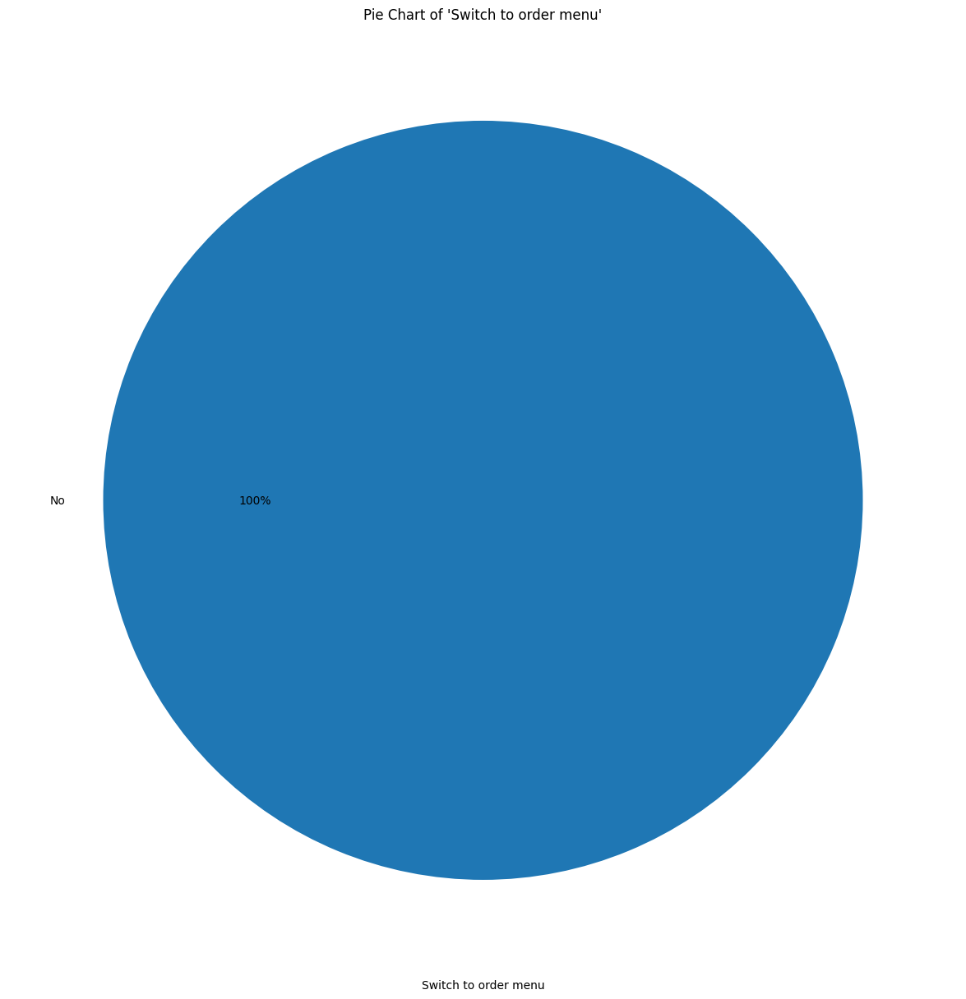

In [25]:
# Create a pie chart for the 'Switch to order menu' column
plt.figure(figsize=(15, 15))
plt.pie(merged_df['Switch to order menu'].value_counts().values, labels=merged_df['Switch to order menu'].value_counts().index, autopct='%.0f%%')
plt.xlabel('Switch to order menu')
plt.title("Pie Chart of 'Switch to order menu'")
plt.show()

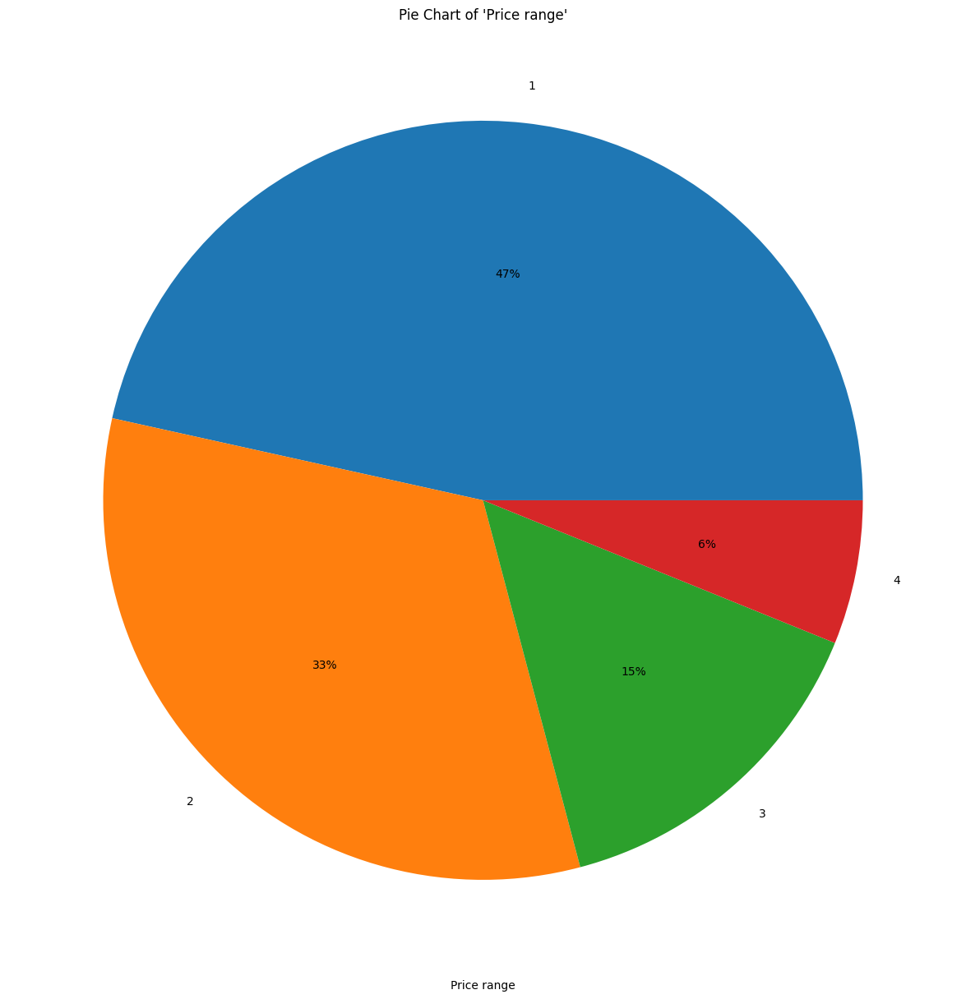

In [26]:
# Create a pie chart for the 'Price range' column
plt.figure(figsize=(15, 15))
plt.pie(merged_df['Price range'].value_counts().values, labels=merged_df['Price range'].value_counts().index, autopct='%.0f%%')
plt.xlabel('Price range')
plt.title("Pie Chart of 'Price range'")
plt.show()

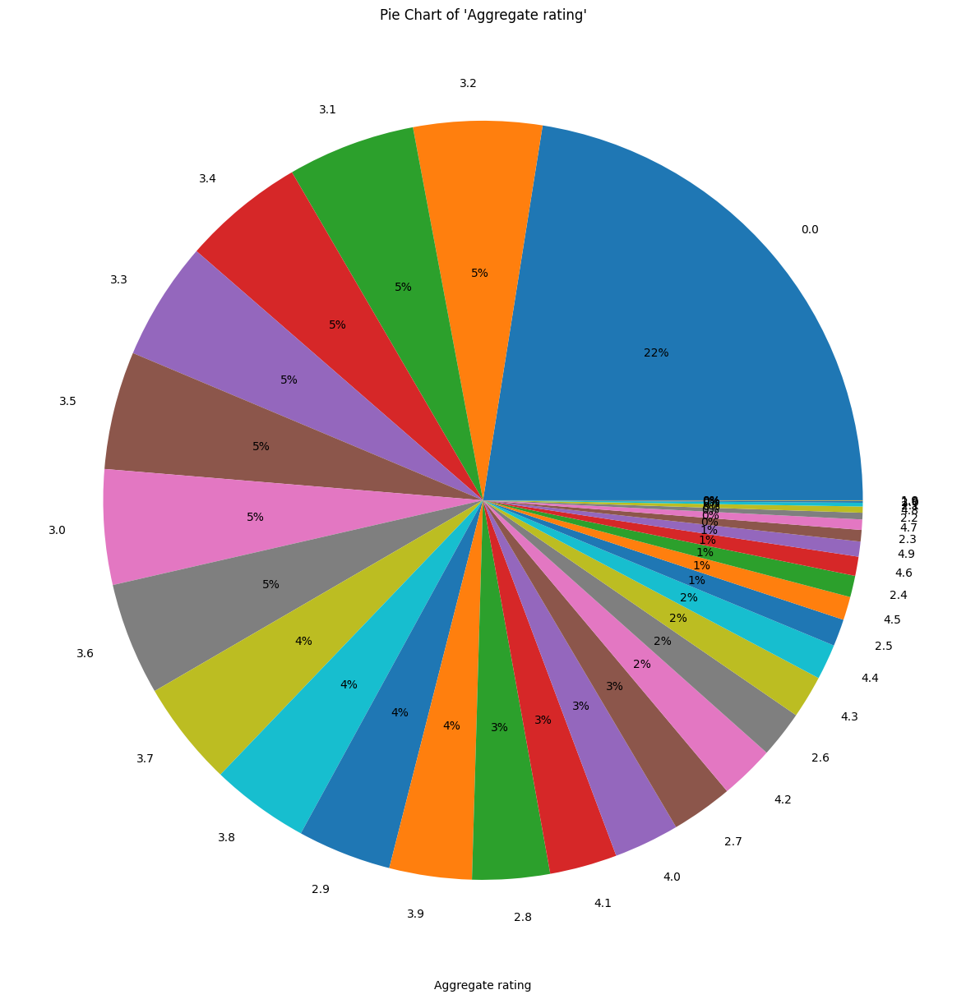

In [27]:
# Create a pie chart for the 'Aggregate rating' column
plt.figure(figsize=(15, 15))
plt.pie(merged_df['Aggregate rating'].value_counts().values, labels=merged_df['Aggregate rating'].value_counts().index, autopct='%.0f%%')
plt.xlabel('Aggregate rating')
plt.title("Pie Chart of 'Aggregate rating'")
plt.show()

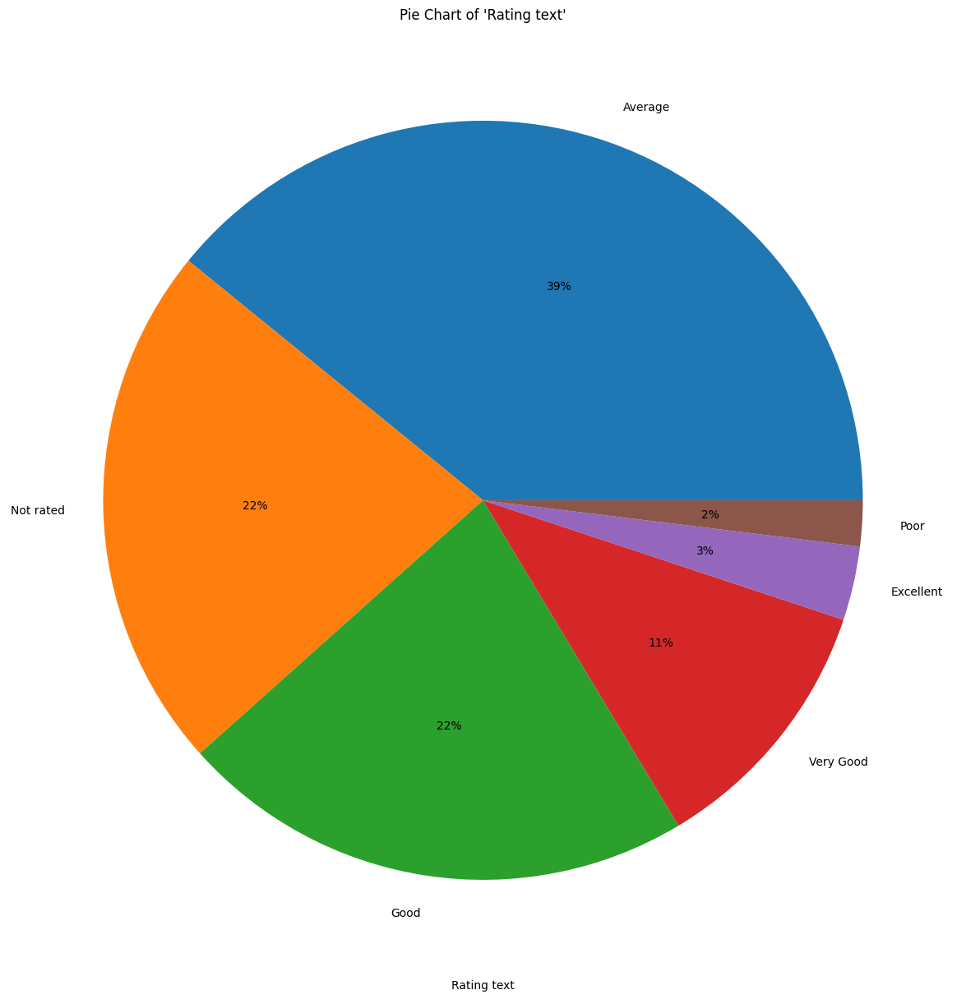

In [28]:
# Create a pie chart for the 'Rating text' column
plt.figure(figsize=(15, 15))
plt.pie(merged_df['Rating text'].value_counts().values, labels=merged_df['Rating text'].value_counts().index, autopct='%.0f%%')
plt.xlabel('Rating text')
plt.title("Pie Chart of 'Rating text'")
plt.show()

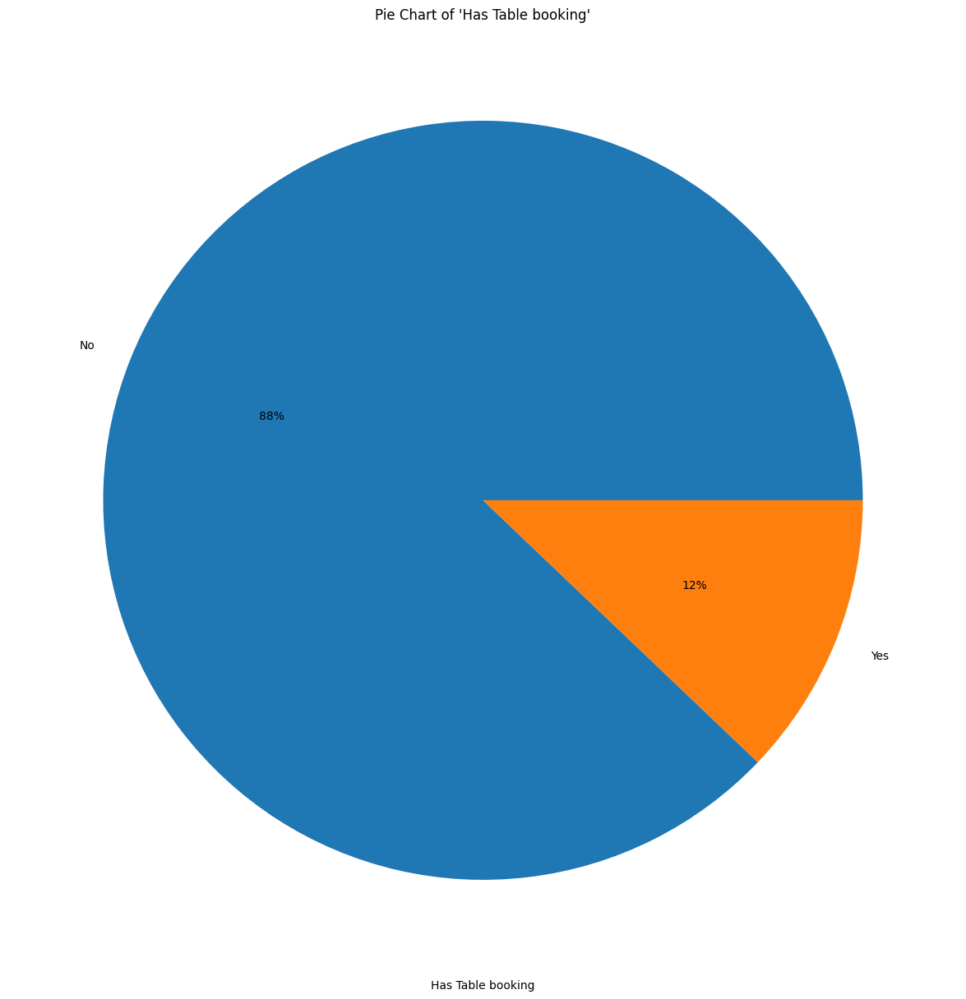

In [29]:
# Create a pie chart for the 'Has Table booking' column
plt.figure(figsize=(15, 15))
plt.pie(merged_df['Has Table booking'].value_counts().values, labels=merged_df['Has Table booking'].value_counts().index, autopct='%.0f%%')
plt.xlabel('Has Table booking')
plt.title("Pie Chart of 'Has Table booking'")
plt.show()

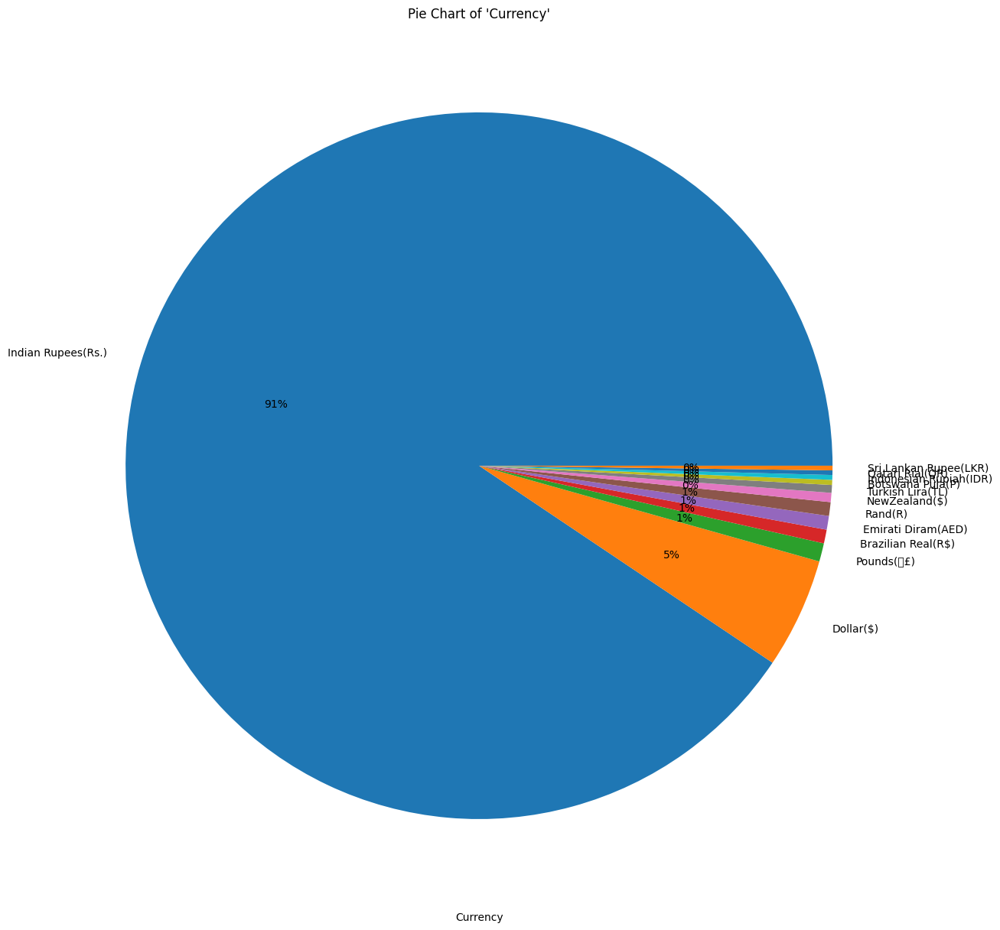

In [30]:
# Create a pie chart for the 'Currency' column
plt.figure(figsize=(15, 15))
plt.pie(merged_df['Currency'].value_counts().values, labels=merged_df['Currency'].value_counts().index, autopct='%.0f%%')
plt.xlabel('Currency')
plt.title("Pie Chart of 'Currency'")
plt.show()

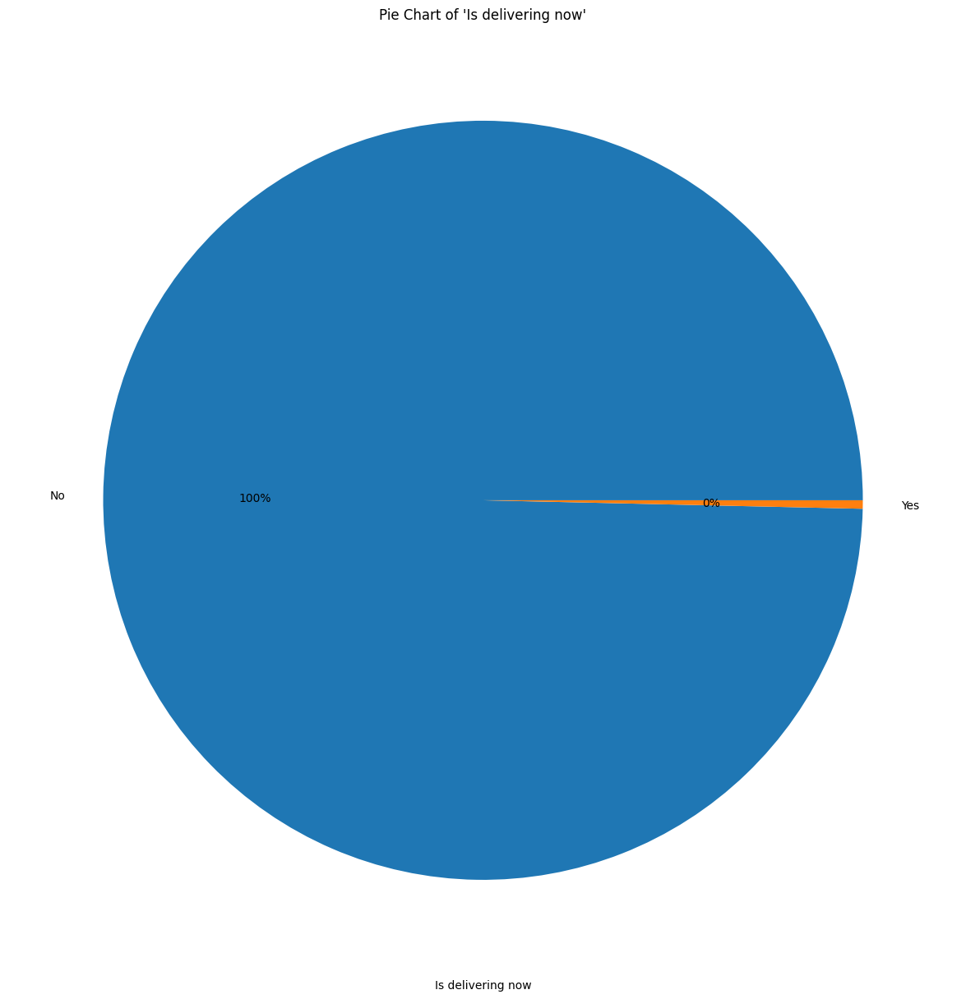

In [31]:
# Create a pie chart for the 'Is delivering now' column
plt.figure(figsize=(15, 15))
plt.pie(merged_df['Is delivering now'].value_counts().values, labels=merged_df['Is delivering now'].value_counts().index, autopct='%.0f%%')
plt.xlabel('Is delivering now')
plt.title("Pie Chart of 'Is delivering now'")
plt.show()

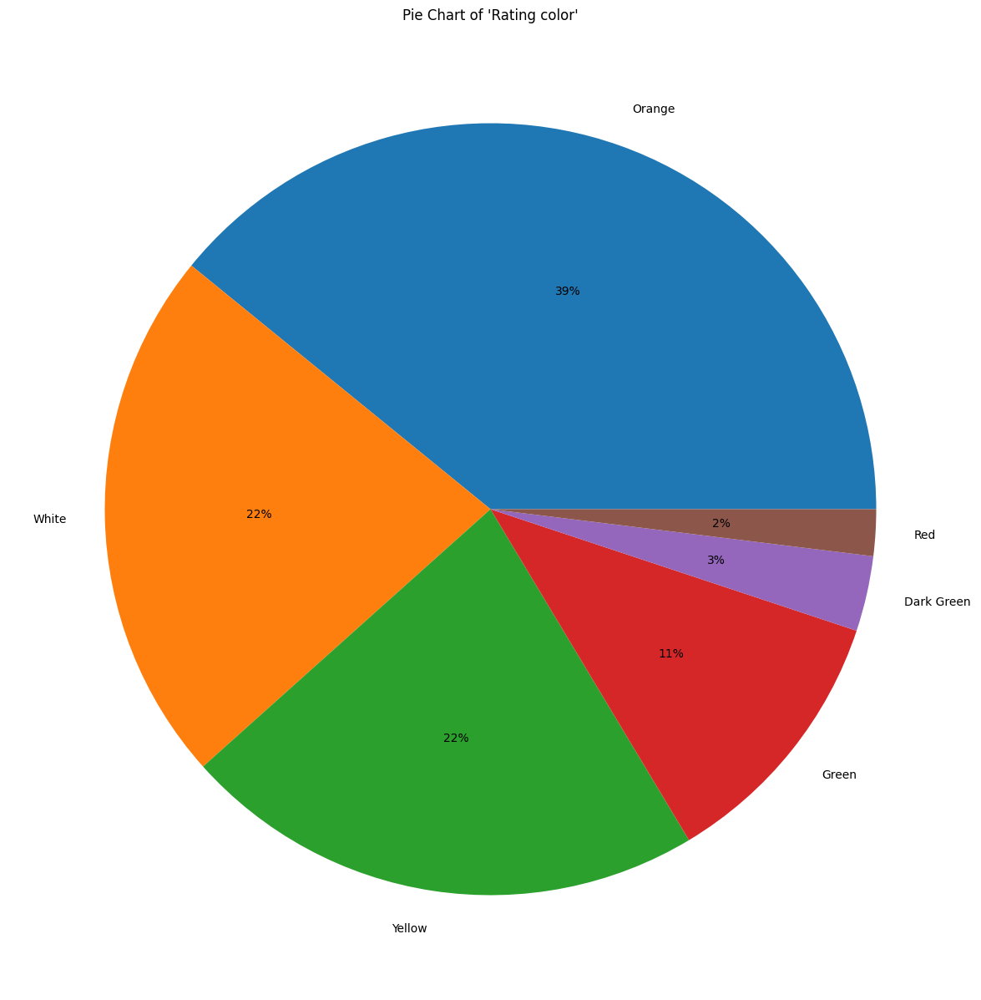

In [32]:
# Create a pie chart for the 'Rating color' column
plt.figure(figsize=(15, 15))
plt.pie(merged_df['Rating color'].value_counts().values, labels=merged_df['Rating color'].value_counts().index, autopct='%.0f%%')
plt.title("Pie Chart of 'Rating color'")
plt.show()

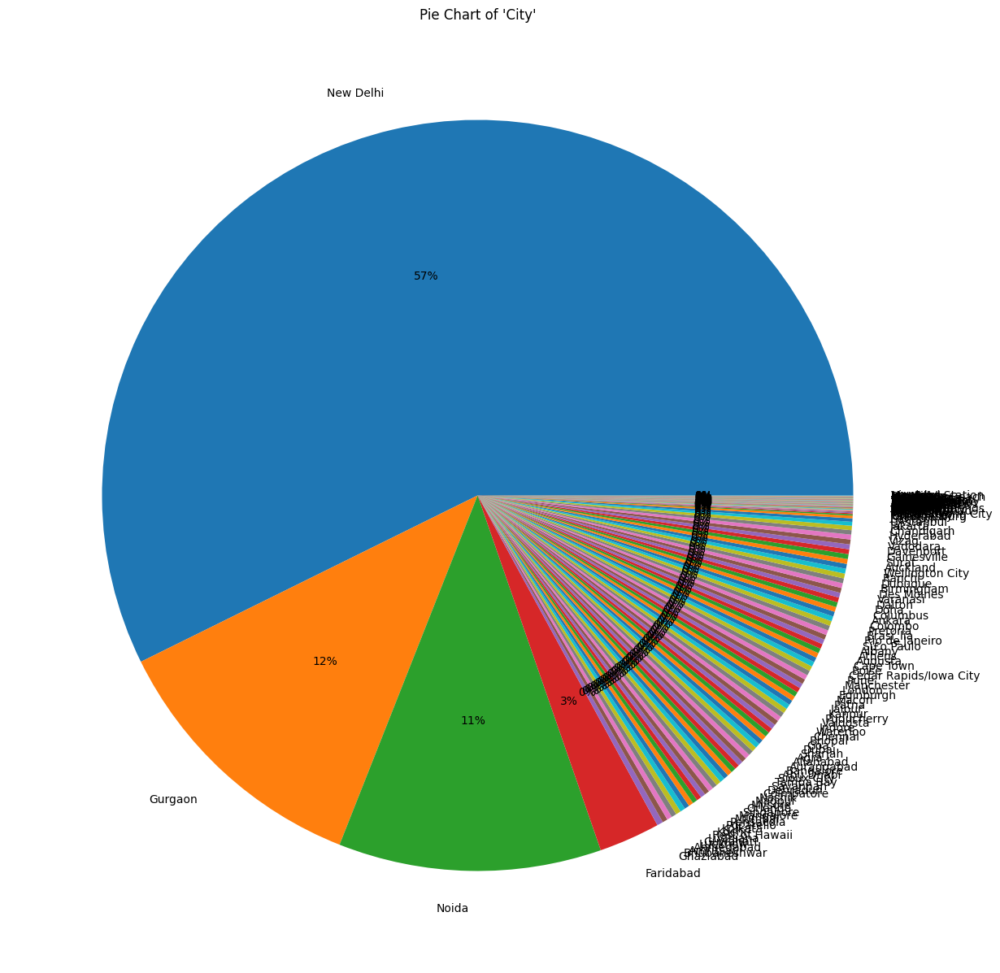

In [33]:
# Create a pie chart for the 'City' column
plt.figure(figsize=(15, 15))

# If you want to explode some slices, you need to specify the explode list.
# You can define 'ex2' as a list containing the same length as the number of cities,
# where each value corresponds to the degree of separation for the corresponding city.
ex2 = [0.1 if city == 'Delhi' else 0 for city in merged_df['City'].value_counts().index]

plt.pie(merged_df['City'].value_counts().values, labels=merged_df['City'].value_counts().index, autopct='%.0f%%', explode=ex2)
plt.title("Pie Chart of 'City'")
plt.show()

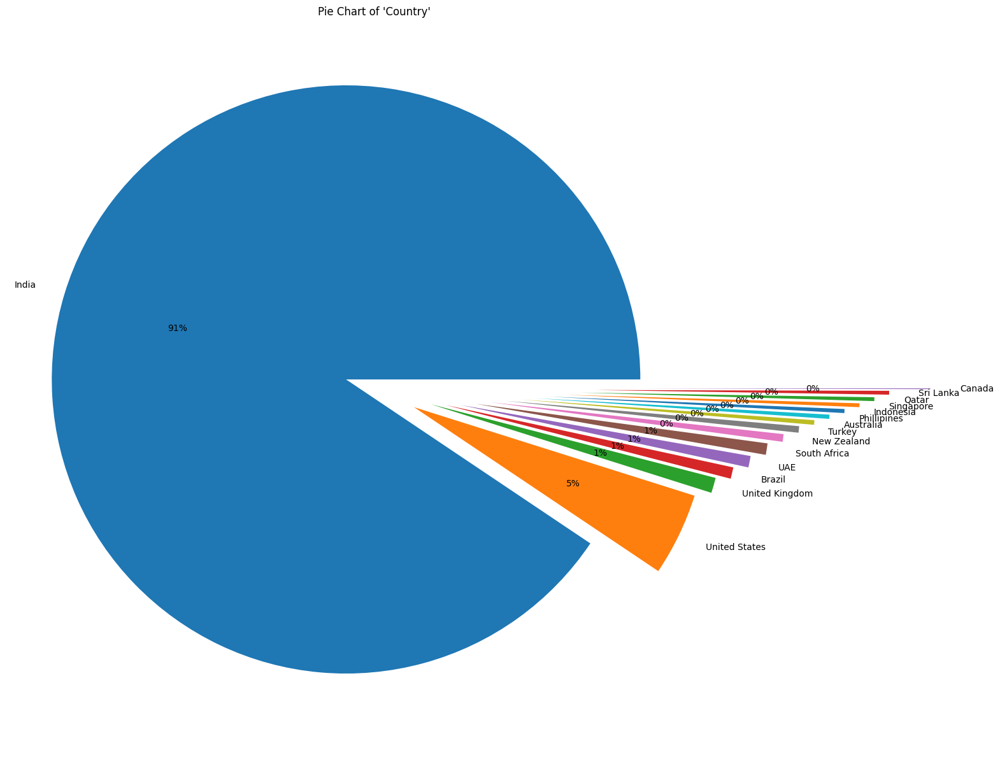

In [34]:
# Create a pie chart for the 'Country' column with the specified explode values
explode1 = [0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7, 0.75, 0.89]
plt.figure(figsize=(15, 15))
plt.pie(merged_df['Country'].value_counts().values, labels=merged_df['Country'].value_counts().index, explode=explode1, autopct='%.0f%%')
plt.title("Pie Chart of 'Country'")
plt.show()

In [35]:
# Access the columns of the DataFrame 'merged_df'
columns_list = merged_df.columns.tolist()
print(columns_list)

['Restaurant ID', 'Restaurant Name', 'Country Code', 'City', 'Address', 'Locality', 'Locality Verbose', 'Longitude', 'Latitude', 'Cuisines', 'Average Cost for two', 'Currency', 'Has Table booking', 'Has Online delivery', 'Is delivering now', 'Switch to order menu', 'Price range', 'Aggregate rating', 'Rating color', 'Rating text', 'Votes', 'Country']


In [36]:
# Feature Engineering

location_specific_details = ['Country Code', 'Country', 'Currency', 'Restaurant ID', 'Restaurant Name', 'City',
       'Address', 'Locality', 'Locality Verbose', 'Longitude', 'Latitude']

restaurant_details = ['Cuisines', 'Has Table booking',
       'Has Online delivery', 'Is delivering now', 'Switch to order menu']

ratings = ['Aggregate rating', 'Rating color', 'Rating text',
       'Votes']

labels = ['Average Cost for two','Price range']

In [37]:
# Univariate analysis for categorical columns
cat_columns = ['Locality', 'Locality Verbose', 'Cuisines', 'Currency', 'Has Table booking', 'Has Online delivery', 'Is delivering now', 'Switch to order menu', 'Price range', 'Rating color', 'Rating text', 'City', 'Country']
for i in cat_columns:
    print('For column', i, 'unique values are:', merged_df[i].unique())
    print('For column', i, 'count of unique values are:', merged_df[i].nunique())

# Access the columns of the DataFrame 'merged_df'
columns_list = merged_df.columns.tolist()
print(columns_list)

For column Locality unique values are: ['Century City Mall, Poblacion, Makati City'
 'Little Tokyo, Legaspi Village, Makati City'
 'Edsa Shangri-La, Ortigas, Mandaluyong City' ... 'Ko\x81ôuyolu'
 'Kuruí_e\x81ôme' 'Moda']
For column Locality count of unique values are: 1208
For column Locality Verbose unique values are: ['Century City Mall, Poblacion, Makati City, Makati City'
 'Little Tokyo, Legaspi Village, Makati City, Makati City'
 'Edsa Shangri-La, Ortigas, Mandaluyong City, Mandaluyong City' ...
 'Ko\x81ôuyolu, ÛÁstanbul' 'Kuruí_e\x81ôme, ÛÁstanbul' 'Moda, ÛÁstanbul']
For column Locality Verbose count of unique values are: 1265
For column Cuisines unique values are: ['French, Japanese, Desserts' 'Japanese'
 'Seafood, Asian, Filipino, Indian' ... 'Burger, Izgara'
 'World Cuisine, Patisserie, Cafe' 'Italian, World Cuisine']
For column Cuisines count of unique values are: 1825
For column Currency unique values are: ['Botswana Pula(P)' 'Brazilian Real(R$)' 'Dollar($)' 'Emirati Diram(A

In [38]:
merged_df.loc[0, 'Address']


'Third Floor, Century City Mall, Kalayaan Avenue, Poblacion, Makati City'

In [39]:
merged_df['Restaurant Name']


0               Le Petit Souffle
1               Izakaya Kikufuji
2         Heat - Edsa Shangri-La
3                           Ooma
4                    Sambo Kojin
                  ...           
9546                NamlÛ± Gurme
9547               Ceviz AÛôacÛ±
9548                       Huqqa
9549                Aôôk Kahve
9550    Walter's Coffee Roastery
Name: Restaurant Name, Length: 9551, dtype: object

In [40]:
merged_df['Locality']


0        Century City Mall, Poblacion, Makati City
1       Little Tokyo, Legaspi Village, Makati City
2       Edsa Shangri-La, Ortigas, Mandaluyong City
3           SM Megamall, Ortigas, Mandaluyong City
4           SM Megamall, Ortigas, Mandaluyong City
                           ...                    
9546                                      Karakí_y
9547                                     Koôuyolu
9548                                   Kuruí_eôme
9549                                   Kuruí_eôme
9550                                          Moda
Name: Locality, Length: 9551, dtype: object

In [41]:
merged_df['Locality Verbose']


0       Century City Mall, Poblacion, Makati City, Mak...
1       Little Tokyo, Legaspi Village, Makati City, Ma...
2       Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...
3       SM Megamall, Ortigas, Mandaluyong City, Mandal...
4       SM Megamall, Ortigas, Mandaluyong City, Mandal...
                              ...                        
9546                                  Karakí_y, ÛÁstanbul
9547                                 Koôuyolu, ÛÁstanbul
9548                               Kuruí_eôme, ÛÁstanbul
9549                               Kuruí_eôme, ÛÁstanbul
9550                                      Moda, ÛÁstanbul
Name: Locality Verbose, Length: 9551, dtype: object

# Catplot

<Figure size 1500x1500 with 0 Axes>

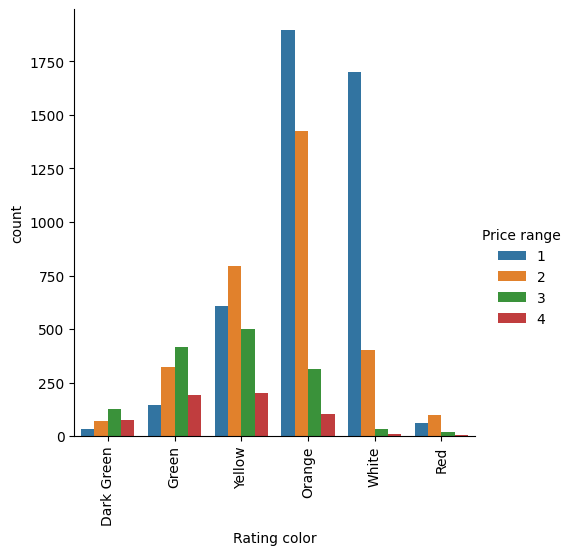

In [42]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 15))
sns.catplot(x='Rating color', hue='Price range', kind='count', data=zomato_df)
plt.xlabel('Rating color')
plt.xticks(rotation=90)
plt.show()


<Figure size 1500x1500 with 0 Axes>

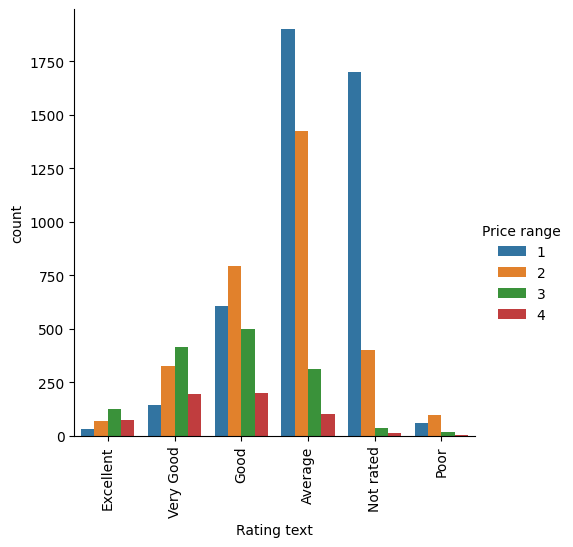

In [43]:
plt.figure(figsize=(15, 15))
sns.catplot(x='Rating text', hue='Price range', kind='count', data=zomato_df)
plt.xlabel('Rating text')
plt.xticks(rotation=90)
plt.show()

<Figure size 1500x1500 with 0 Axes>

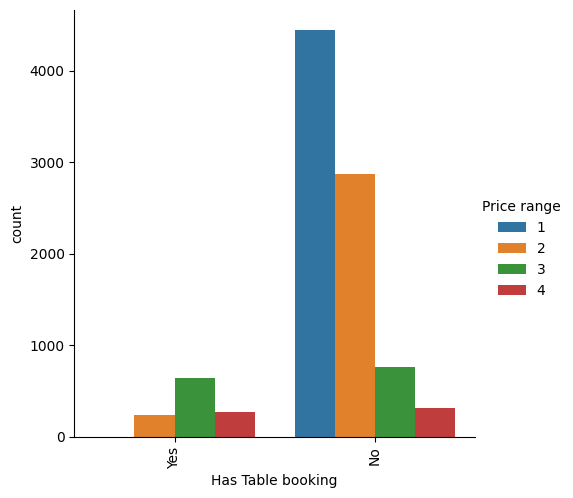

In [44]:
plt.figure(figsize=(15, 15))
sns.catplot(x='Has Table booking', hue='Price range', kind='count', data=merged_df)
plt.xlabel('Has Table booking')
plt.xticks(rotation=90)
plt.show()

<Figure size 1500x1500 with 0 Axes>

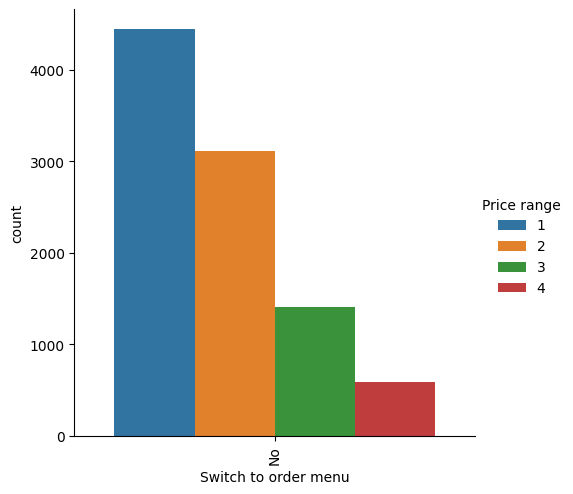

In [45]:
plt.figure(figsize=(15, 15))
sns.catplot(x='Switch to order menu', hue='Price range', kind='count', data=merged_df)
plt.xlabel('Switch to order menu')
plt.xticks(rotation=90)
plt.show()

<Figure size 1500x1500 with 0 Axes>

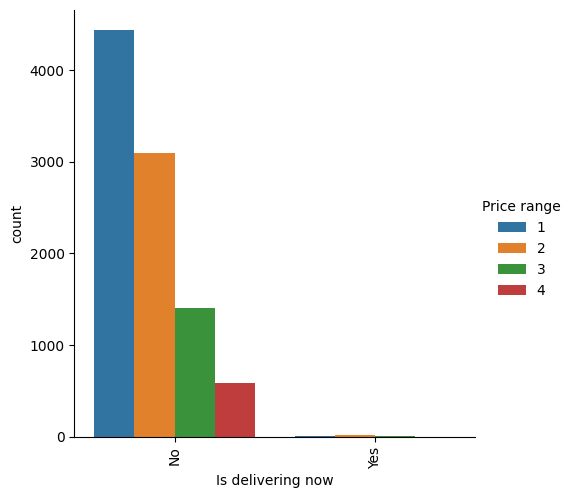

In [46]:
plt.figure(figsize=(15, 15))
sns.catplot(x='Is delivering now', hue='Price range', kind='count', data=merged_df)
plt.xlabel('Is delivering now')
plt.xticks(rotation=90)
plt.show()

<Figure size 1500x1500 with 0 Axes>

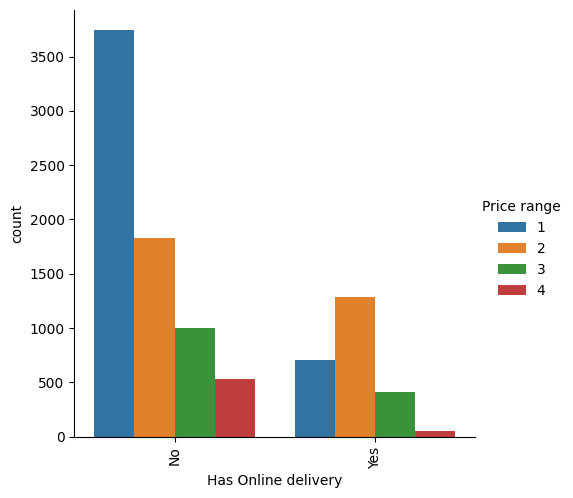

In [47]:
plt.figure(figsize=(15, 15))
sns.catplot(x='Has Online delivery', hue='Price range', kind='count', data=merged_df)
plt.xlabel('Has Online delivery')
plt.xticks(rotation=90)
plt.show()

<Figure size 1500x1500 with 0 Axes>

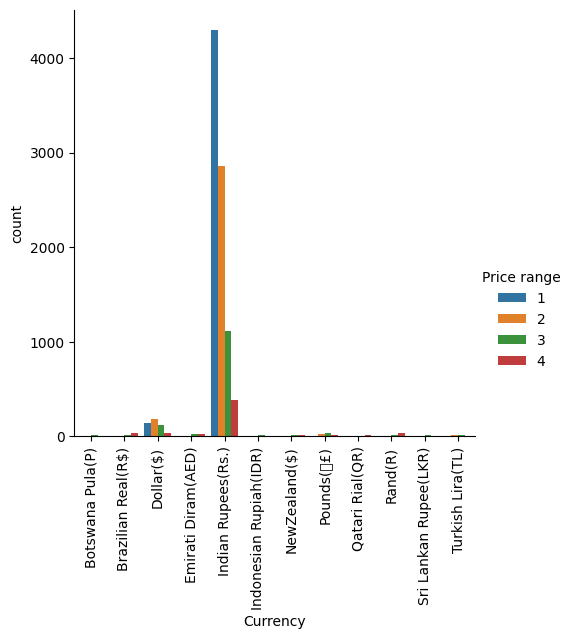

In [48]:
plt.figure(figsize=(15, 15))
sns.catplot(x='Currency', hue='Price range', kind='count', data=merged_df)
plt.xlabel('Currency')
plt.xticks(rotation=90)
plt.show()

<Figure size 1500x1500 with 0 Axes>

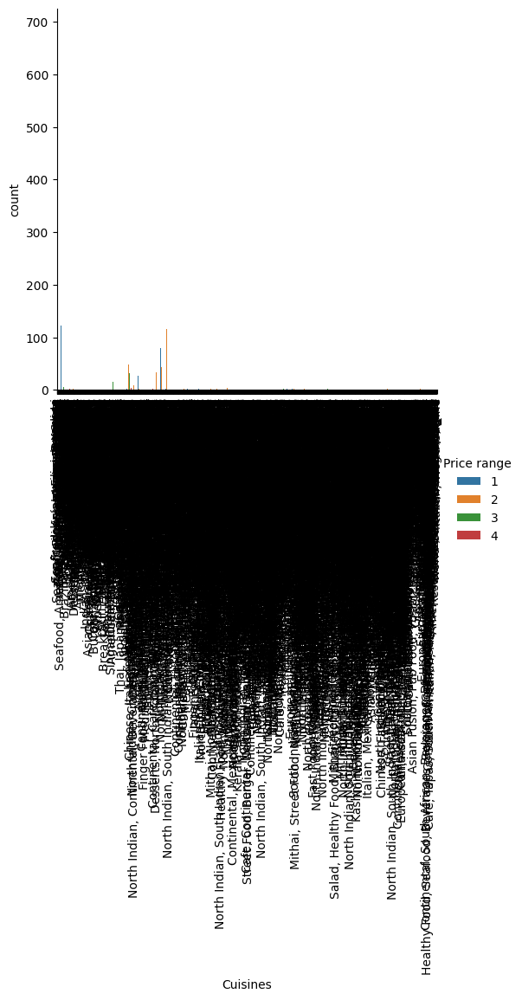

In [49]:
plt.figure(figsize=(15, 15))
sns.catplot(x='Cuisines', hue='Price range', kind='count', data=merged_df)
plt.xlabel('Cuisines')
plt.xticks(rotation=90)
plt.show()

<Figure size 1500x1500 with 0 Axes>

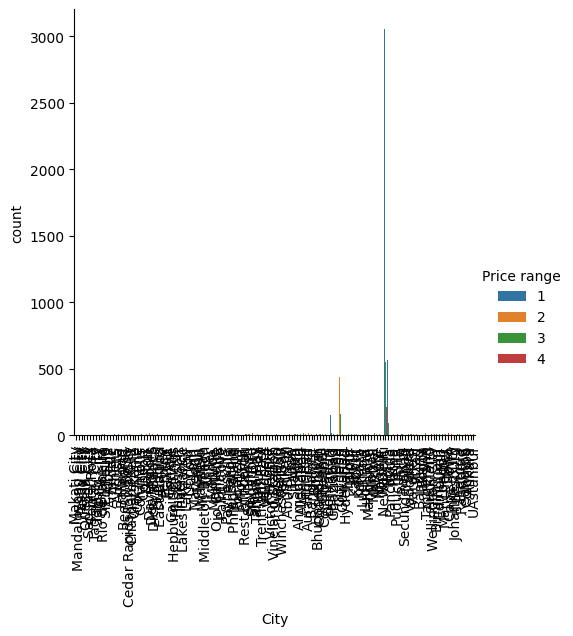

In [50]:
plt.figure(figsize=(15, 15))
sns.catplot(x='City', hue='Price range', kind='count', data=merged_df)
plt.xlabel('City')
plt.xticks(rotation=90)
plt.show()

<Figure size 1500x1500 with 0 Axes>

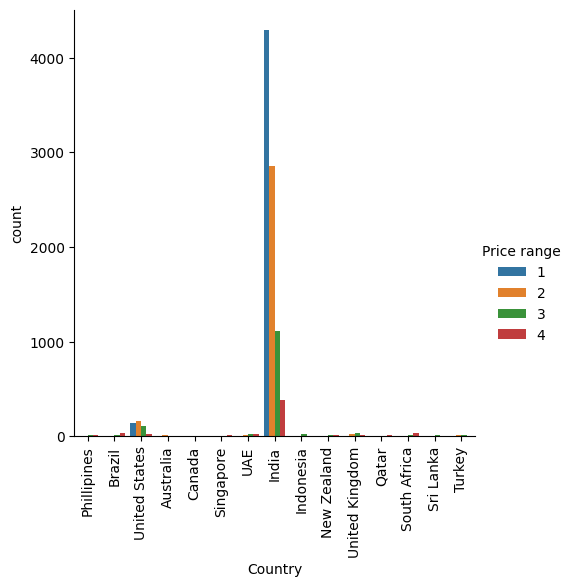

In [51]:
plt.figure(figsize=(15, 15))
sns.catplot(x='Country', hue='Price range', kind='count', data=merged_df)
plt.xlabel('Country')
plt.xticks(rotation=90)
plt.show()

# Boxplot

In [52]:
cat_columns

['Locality',
 'Locality Verbose',
 'Cuisines',
 'Currency',
 'Has Table booking',
 'Has Online delivery',
 'Is delivering now',
 'Switch to order menu',
 'Price range',
 'Rating color',
 'Rating text',
 'City',
 'Country']

In [53]:
cont_columns

Index(['Restaurant ID', 'Country Code', 'Longitude', 'Latitude',
       'Average Cost for two', 'Price range', 'Aggregate rating', 'Votes'],
      dtype='object')

In [54]:
merged_df['Price range'].value_counts()


Price range
1    4444
2    3113
3    1408
4     586
Name: count, dtype: int64

In [55]:
merged_df['Average Cost for two'].sort_values(ascending=False)


9284    800000
9283    800000
9287    500000
9289    450000
9294    350000
         ...  
87           0
397          0
84           0
277          0
677          0
Name: Average Cost for two, Length: 9551, dtype: int64

In [56]:
merged_df['Average Cost for two'].value_counts().sort_values()

Average Cost for two
545         1
515         1
240         1
125         1
500000      1
         ... 
600       652
200       687
400       857
300       897
500       900
Name: count, Length: 140, dtype: int64

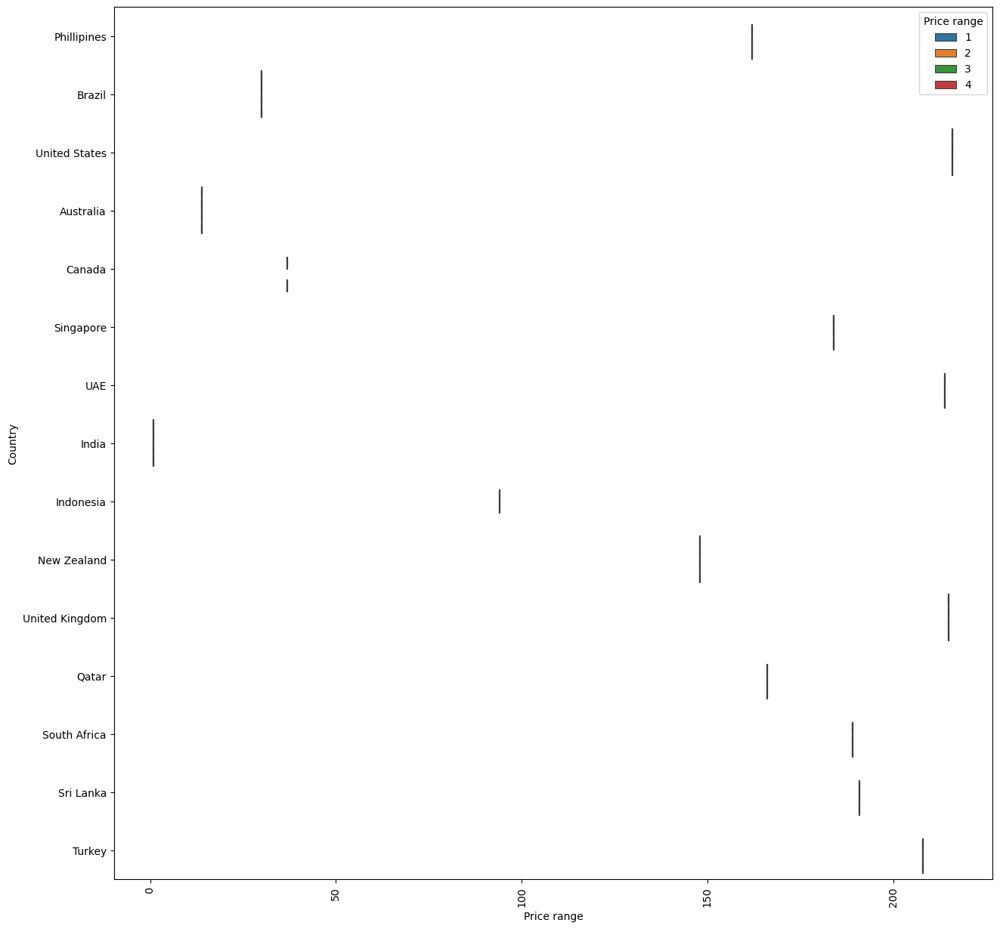

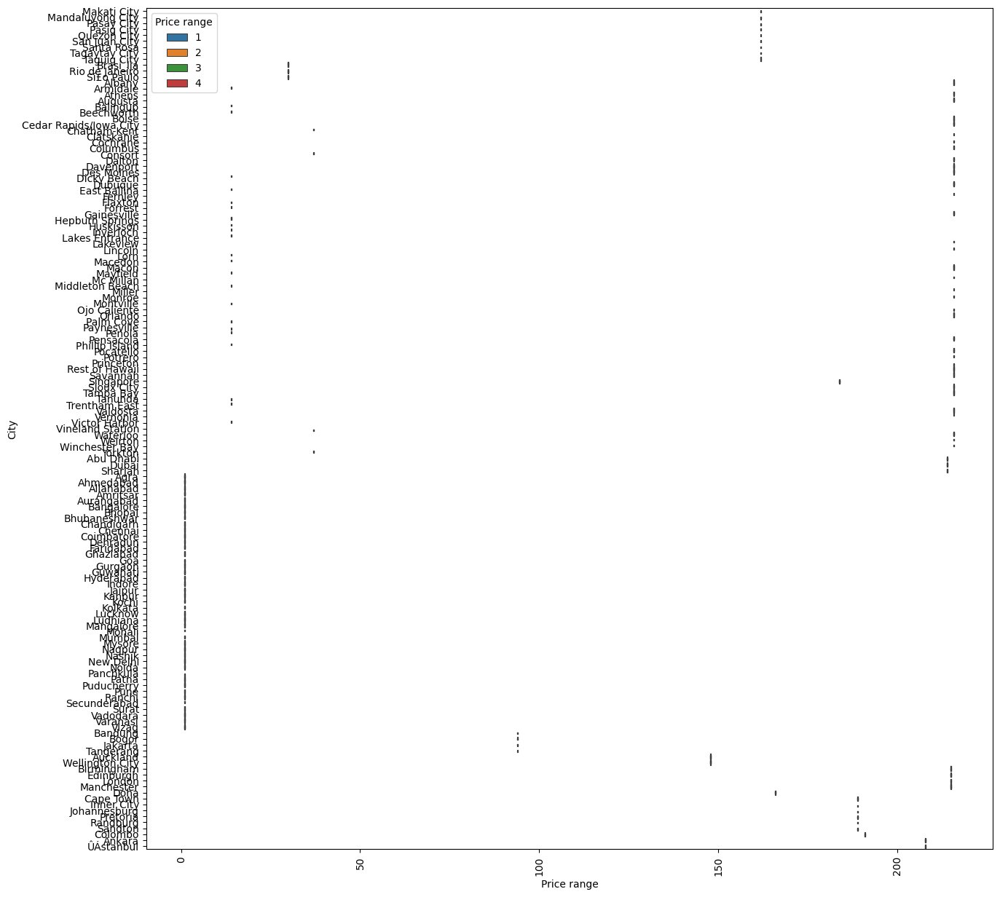

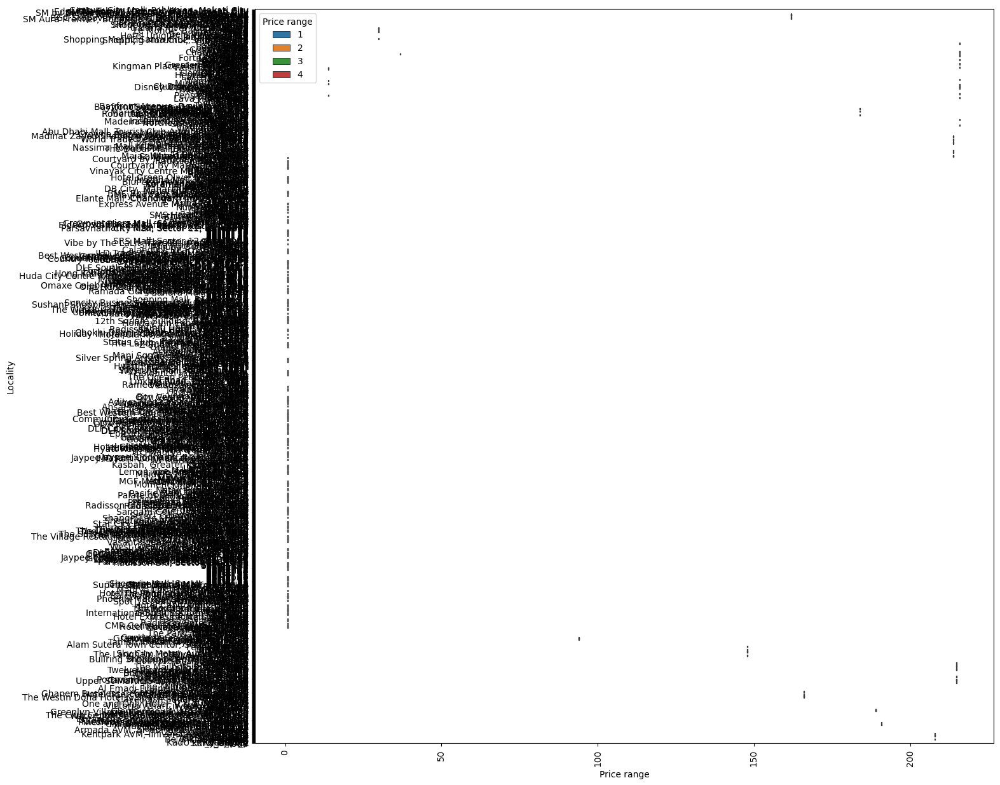

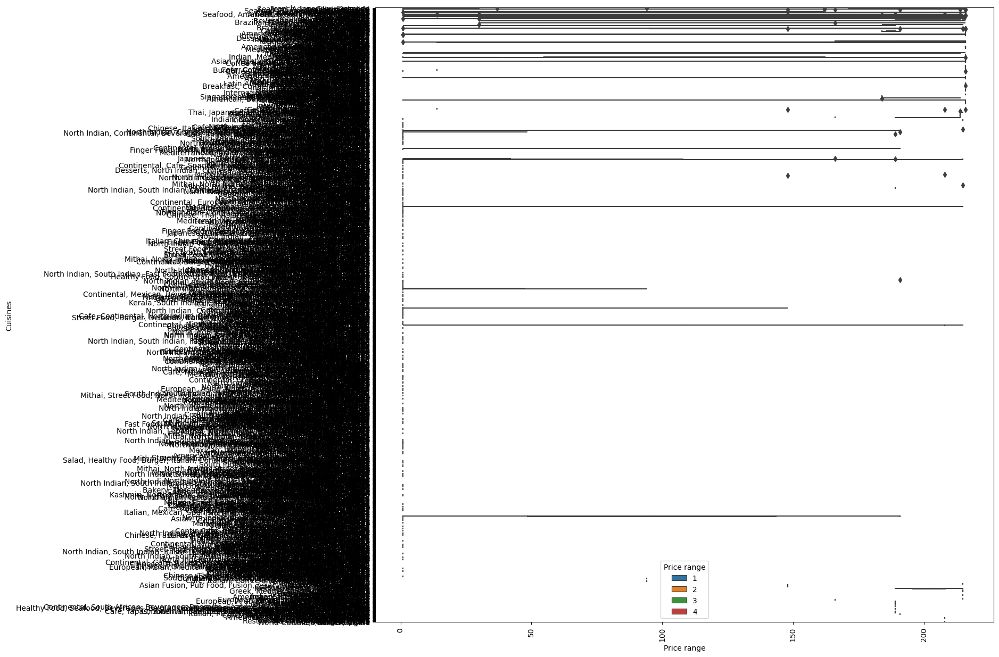

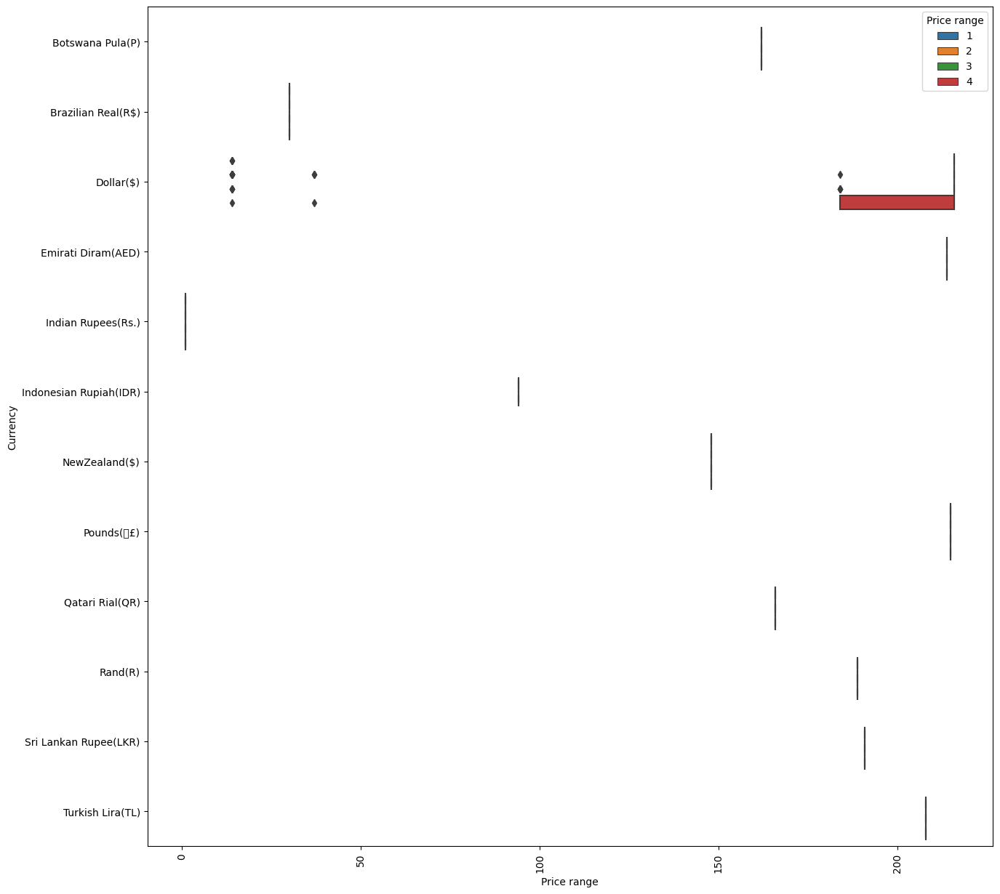

...

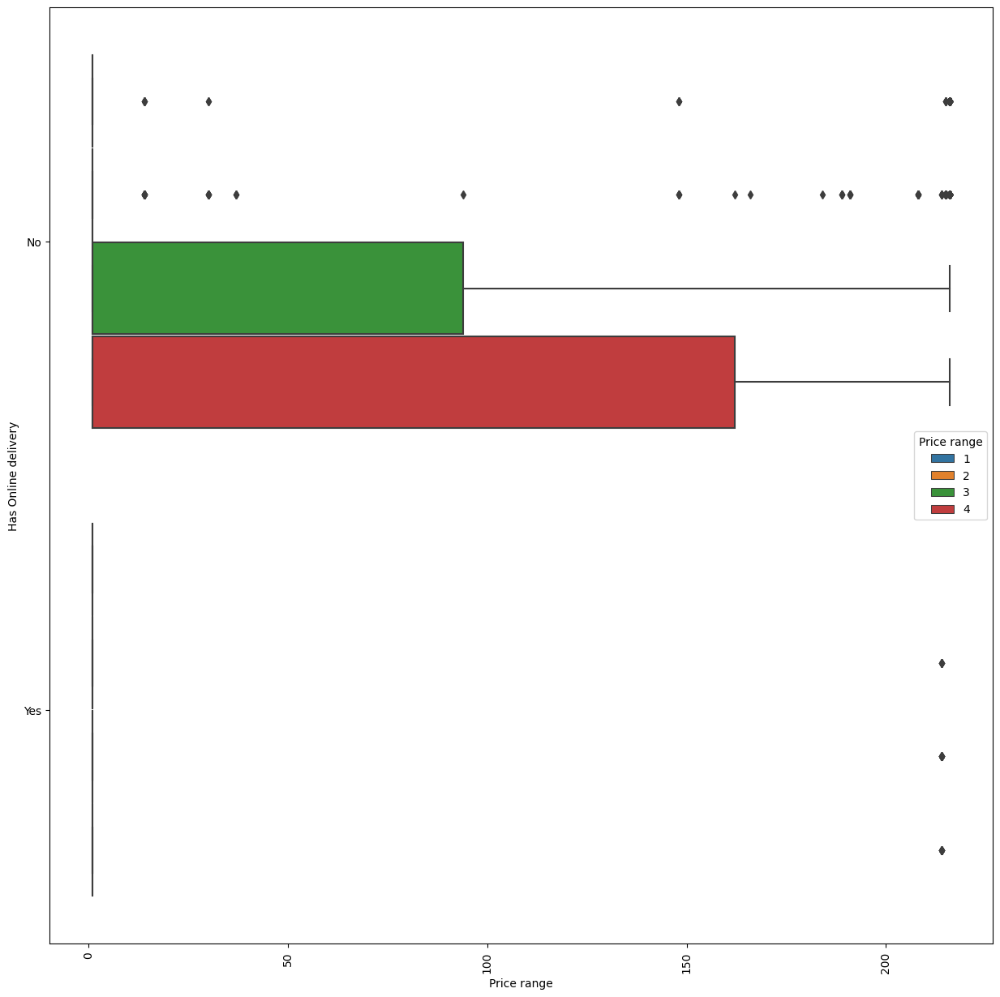

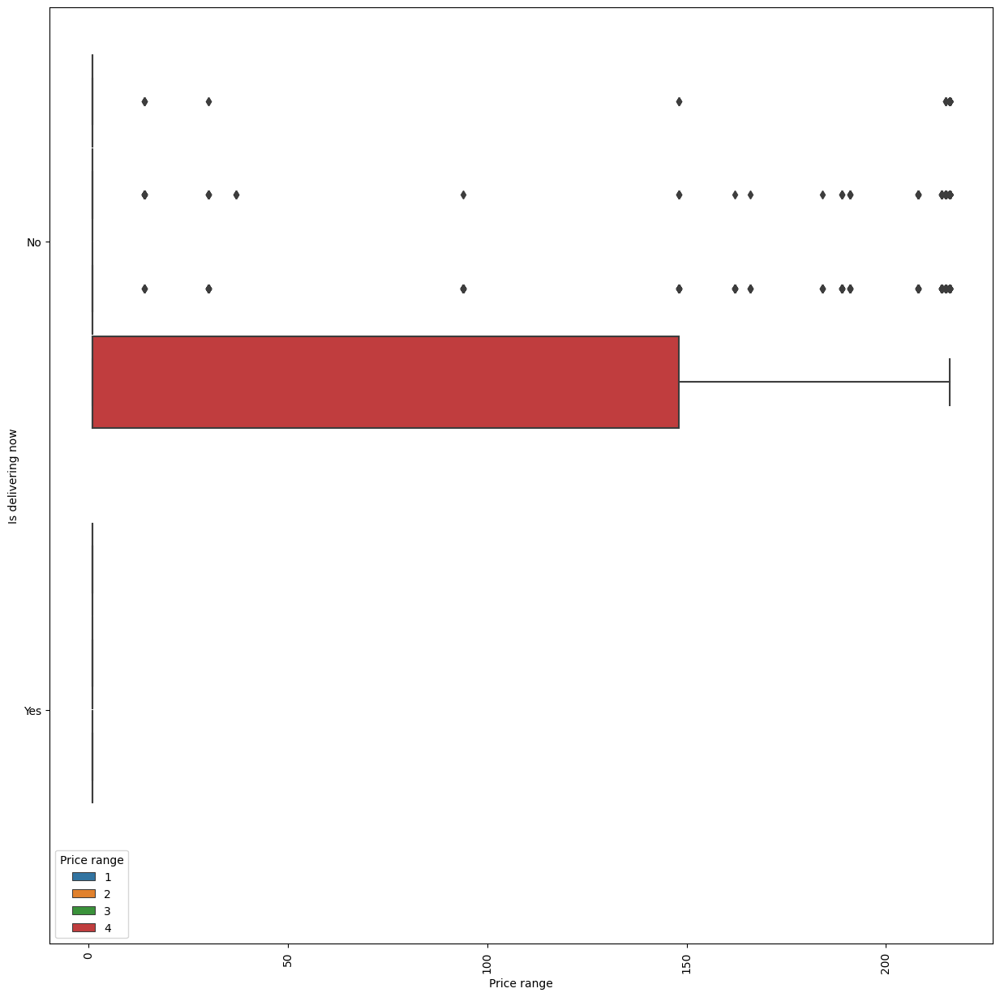

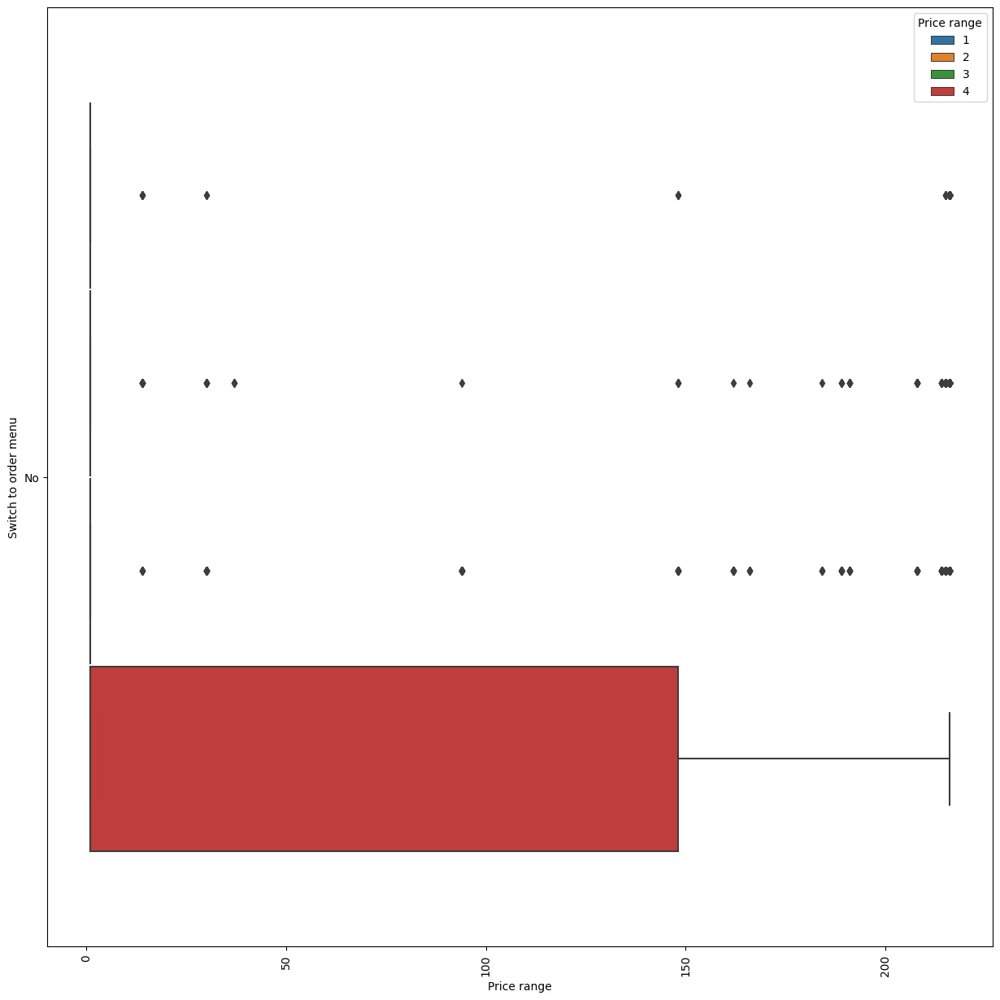

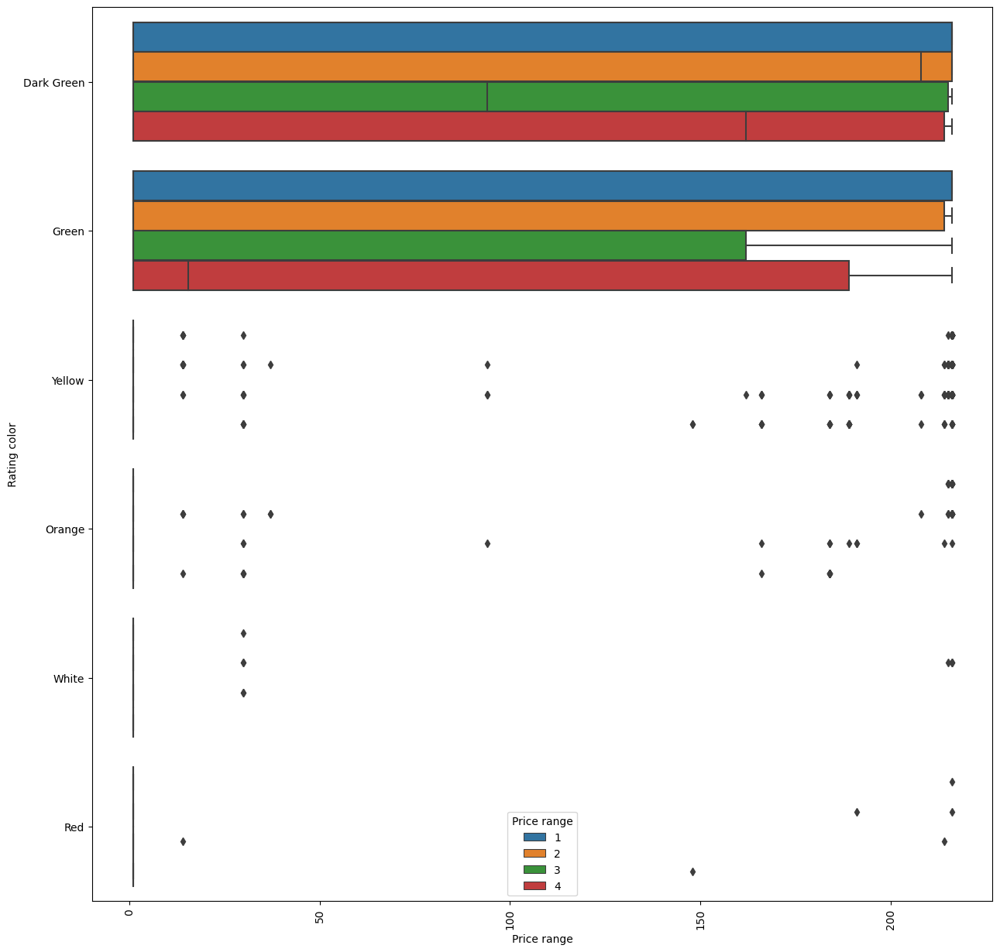

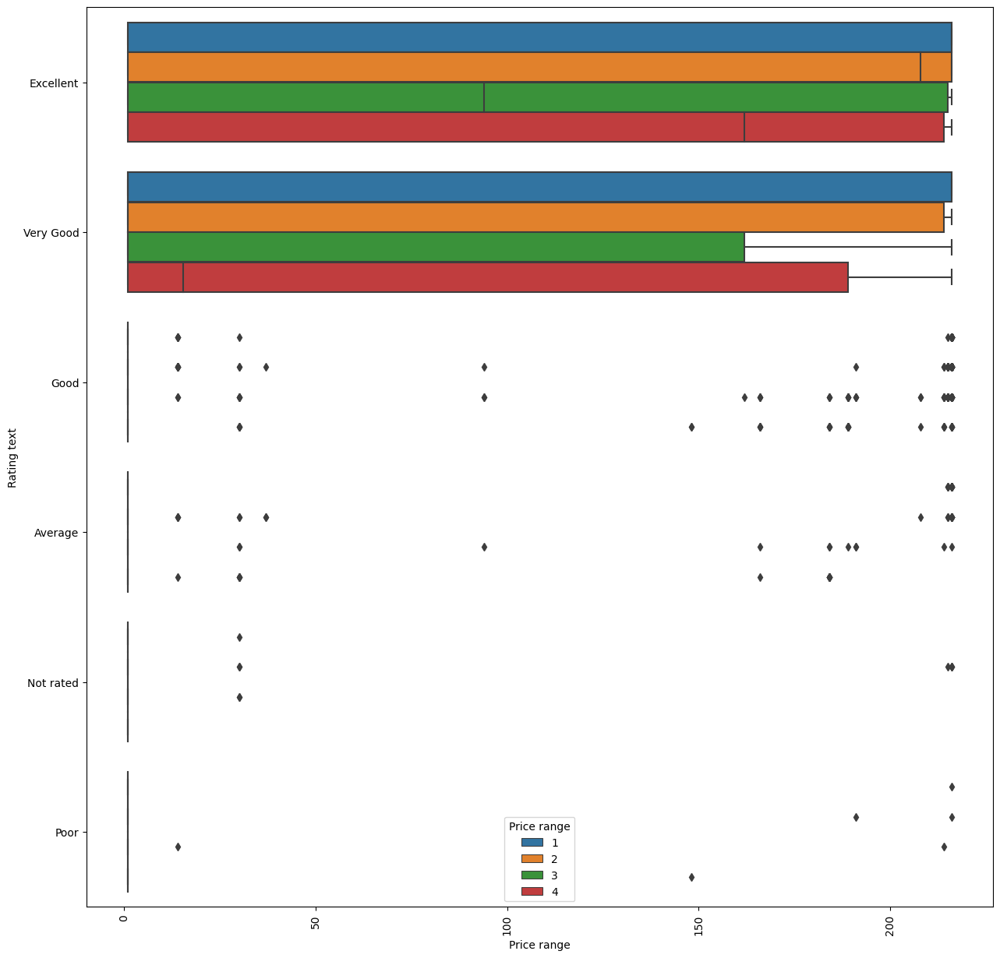

In [57]:
for i in ['Country', 'City', 'Locality', 'Cuisines', 'Currency', 'Has Table booking', 'Has Online delivery', 'Is delivering now', 'Switch to order menu', 'Rating color', 'Rating text']:
    plt.figure(figsize=(15, 15))
    sns.boxplot(x='Country Code', y=i, hue='Price range', data=merged_df)
    plt.xlabel('Price range')
    plt.xticks(rotation=90)
    plt.show()


In [58]:
cont_columns

Index(['Restaurant ID', 'Country Code', 'Longitude', 'Latitude',
       'Average Cost for two', 'Price range', 'Aggregate rating', 'Votes'],
      dtype='object')

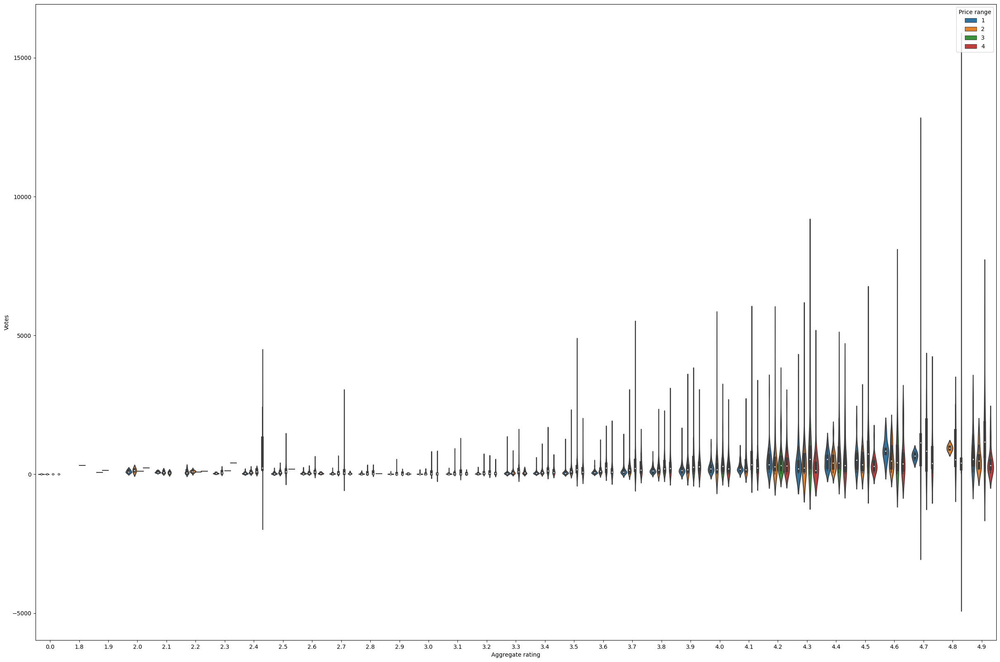

In [59]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(30, 20))
sns.violinplot(x='Aggregate rating', y='Votes', data=zomato_df, hue='Price range')
plt.show()


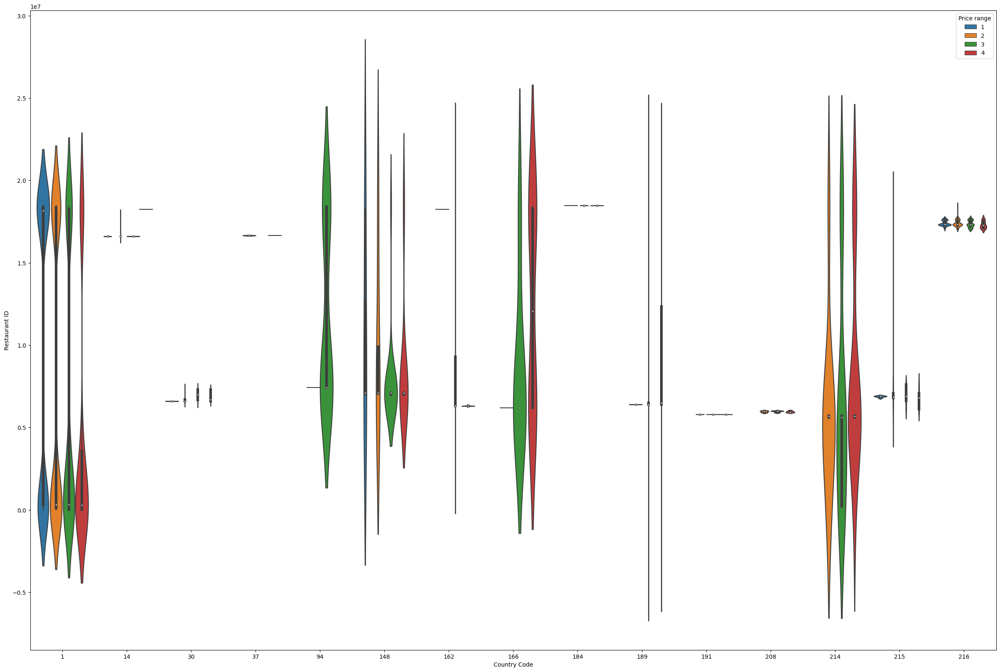

In [60]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(30, 20))
sns.violinplot(x='Country Code', y='Restaurant ID', data=zomato_df, hue='Price range')
plt.show()


In [61]:
cont_columns

Index(['Restaurant ID', 'Country Code', 'Longitude', 'Latitude',
       'Average Cost for two', 'Price range', 'Aggregate rating', 'Votes'],
      dtype='object')

In [62]:
import pandas as pd

# Load the data into the DataFrame 'df' with 'latin-1' encoding
df = pd.read_csv('zomato.csv', encoding='latin-1')

# Create a copy of the DataFrame
df_copy = df.copy()


In [63]:
df=df_copy.copy()

In [64]:
df.shape[0]

9551

In [65]:
# Using Z Statistics to check and remove any more outliers:

from scipy.stats import zscore

z_score = zscore(df[cont_columns])

abs_z_score = np.abs(z_score)

filtering_entry = (abs_z_score < 2.5).all(axis=1) # values lying in 3 times std will be removed

df = df[filtering_entry]

df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,8.468000e+03,8468.0,8468.000000,8468.000000,8468.000000,8468.000000,8468.000000,8468.000000
mean,8.792870e+06,1.0,72.752701,26.459437,607.144544,1.697095,2.488191,88.333255
std,8.967058e+06,0.0,18.192358,6.994578,582.775880,0.837870,1.507122,165.405492
min,5.300000e+01,1.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,3.010552e+05,1.0,77.098694,28.493433,300.000000,1.000000,0.000000,3.000000
50%,2.500122e+06,1.0,77.202504,28.570000,450.000000,1.000000,3.100000,23.000000
75%,1.836305e+07,1.0,77.285369,28.638507,700.000000,2.000000,3.500000,92.000000
max,1.850065e+07,1.0,91.806493,35.000000,8000.000000,4.000000,4.900000,1221.000000


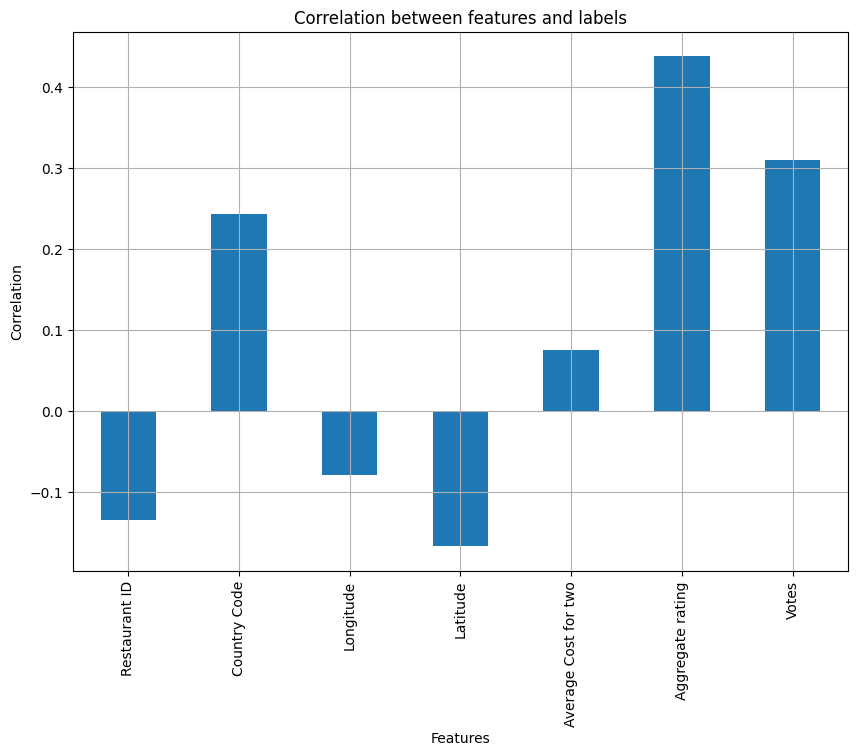

In [66]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data into the DataFrame 'df' with appropriate encoding
# Try using different encodings until the file is read successfully
encodings = ['utf-8', 'latin-1', 'iso-8859-1', 'cp1252']
for encoding in encodings:
    try:
        df = pd.read_csv('zomato.csv', encoding=encoding)
        break  # Break the loop if the file is read successfully
    except UnicodeDecodeError:
        continue  # Try the next encoding if there's an error

# Select only numeric columns for correlation calculation
numeric_columns = df.select_dtypes(include=['int64', 'float64'])

# Compute correlation with the 'Price range' column and plot the results
correlation = numeric_columns.drop(columns='Price range').corrwith(df['Price range'])
correlation.plot(kind='bar', grid=True, figsize=(10, 7), title='Correlation between features and labels')
plt.xlabel('Features')
plt.ylabel('Correlation')
plt.show()


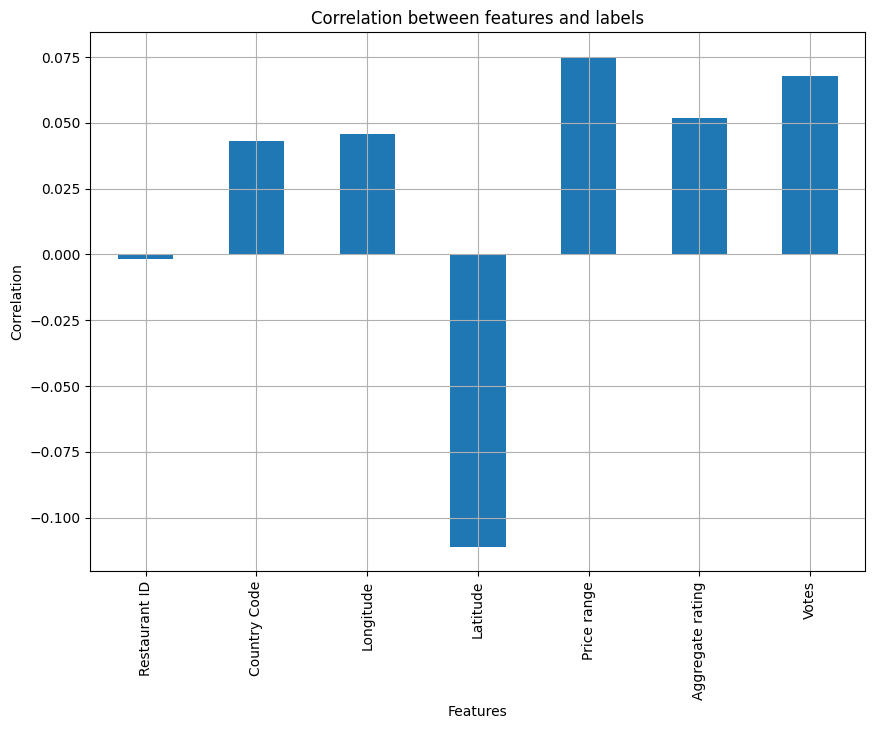

In [67]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Load the data into the DataFrame 'df' with appropriate encoding
# Try using different encodings until the file is read successfully
encodings = ['utf-8', 'latin-1', 'iso-8859-1', 'cp1252']
for encoding in encodings:
    try:
        df = pd.read_csv('zomato.csv', encoding=encoding)
        break  # Break the loop if the file is read successfully
    except UnicodeDecodeError:
        continue  # Try the next encoding if there's an error

# Convert 'Average Cost for two' column to numeric type
df['Average Cost for two'] = pd.to_numeric(df['Average Cost for two'], errors='coerce')

# Select only numeric columns for correlation calculation
numeric_columns = df.select_dtypes(include=['int64', 'float64'])

# Compute correlation with the 'Average Cost for two' column and plot the results
correlation = numeric_columns.drop(columns='Average Cost for two').corrwith(df['Average Cost for two'])
correlation.plot(kind='bar', grid=True, figsize=(10, 7), title='Correlation between features and labels')
plt.xlabel('Features')
plt.ylabel('Correlation')
plt.show()


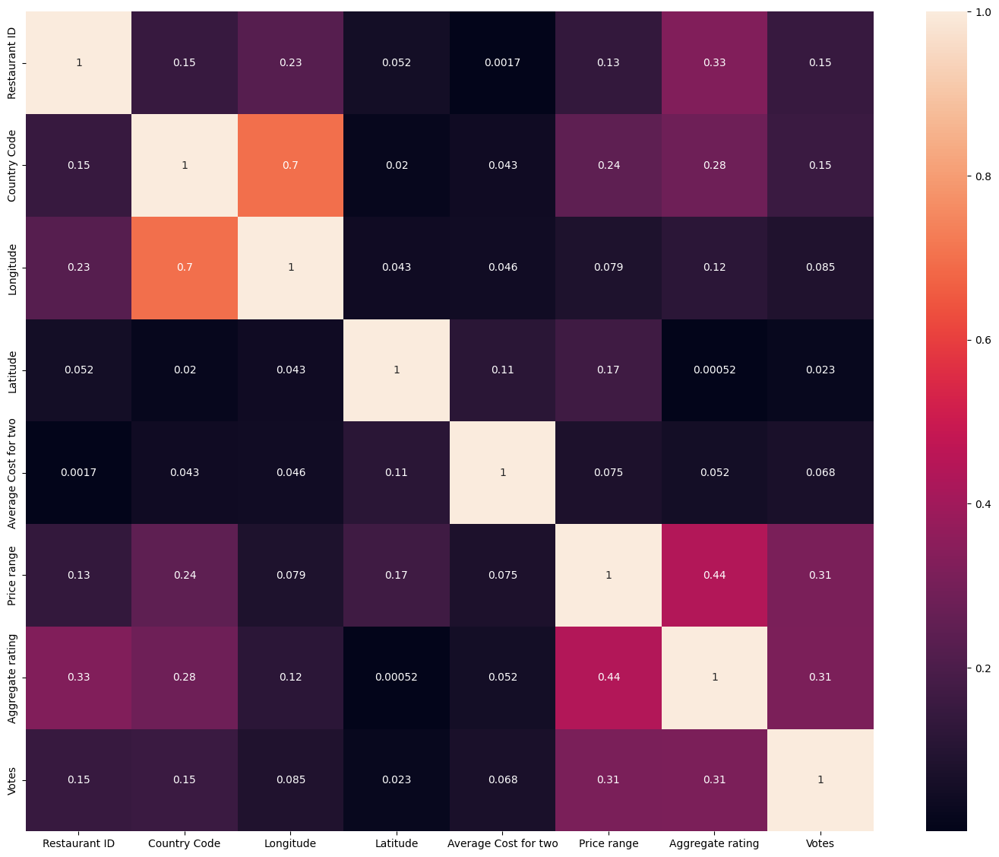

In [68]:
# Compute correlation and plot the heatmap
df_corr = numeric_columns.corr().abs()
plt.figure(figsize=(18, 14))
sns.heatmap(df_corr, annot=True, annot_kws={'size': 10})
plt.show()

In [69]:
# Select only numeric columns for skew calculation
numeric_columns = df.select_dtypes(include=['int64', 'float64'])

# Calculate the skewness of numeric columns and sort the values
skewness = numeric_columns.skew().sort_values()

print(skewness)


Latitude                -3.081635
Longitude               -2.807328
Aggregate rating        -0.954130
Restaurant ID            0.061570
Price range              0.889618
Country Code             3.043965
Votes                    8.807637
Average Cost for two    35.477915
dtype: float64


In [70]:
from statsmodels.stats.outliers_influence import variance_inflation_factor


vif = pd.DataFrame()
vif['vif'] = [variance_inflation_factor(df[cont_columns],i) for i in range(df[cont_columns].shape[1])]
vif['features'] = df[cont_columns].columns
vif

,vif,features
0,1.953701,Restaurant ID
1,2.422515,Country Code
2,5.551629,Longitude
3,4.889628,Latitude
4,1.038150,Average Cost for two
5,5.913270,Price range
6,5.572680,Aggregate rating
7,1.317995,Votes


In [71]:
df.drop(columns=['Country Code','Longitude'],axis=1,inplace=True)

In [72]:
cols = ['Restaurant ID','Latitude','Price range', 'Aggregate rating', 'Votes','Average Cost for two']

In [73]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif['vif'] = [variance_inflation_factor(df[cols],i) for i in range(df[cols].shape[1])]
vif['features'] = df[cols].columns
vif

,vif,features
0,1.862826,Restaurant ID
1,3.706971,Latitude
2,5.236119,Price range
3,5.173021,Aggregate rating
4,1.301808,Votes
5,1.022714,Average Cost for two


In [74]:
df.drop(columns=['Price range',],axis=1,inplace=True)

In [75]:
df.drop(columns=['Restaurant ID',],axis=1,inplace=True)

In [76]:
# Splitting data into features and label:

y1 = df['Average Cost for two']
X1 = df.drop('Average Cost for two',axis=1)

In [77]:
X1_dum = pd.get_dummies(X1)

In [78]:
X1_dum.shape

(9551, 20837)

In [79]:
from sklearn.preprocessing import PowerTransformer

pt1 = PowerTransformer()

X_trans1 = pt1.fit_transform(X1_dum)

In [80]:
# Using SelectKBest feature selection method: # It is one of the feature selection method:
# when there are lot of features and you cant graphically analyse , short way , selectKbest can be
# used:

from sklearn.feature_selection import SelectKBest, f_classif

# SelectKBest uses f_classif function to select best features where f_classif uses ANOVA test

In [81]:
best_features1 = SelectKBest(score_func = f_classif,k = 17000)
fit1 = best_features1.fit(X_trans1,y1)

In [82]:
fit1

SelectKBest(k=17000)

In [83]:
data_scores1 = pd.DataFrame(fit1.scores_)

In [84]:
data_scores1

,0
0,15.910177
1,25.569652
2,38.952588
3,0.071998
4,0.096902
...,...
20832,10.963353
20833,5.609832
20834,13.865711
20835,0.839187


In [85]:
print(data_scores1.nlargest(17000,data_scores1.columns),'\n') # print 7000 best features


             0
37         inf
44         inf
500        inf
509        inf
587        inf
...        ...
7876  0.071998
8442  0.071998
9830  0.071998
2100  0.071998
5198  0.071998

[17000 rows x 1 columns] 



In [86]:
# Splitting our data to training data and testing data
# x_train,x_test,y_train,y_test

x_train,x_test,y_train,y_test = train_test_split(X_trans1,y1,test_size=0.20,random_state=1)

# Here we are keeping training data as our scalled data and testing data as our label or target.

In [87]:
# MOdel instantiating and training

rm = LinearRegression()
rm.fit(x_train,y_train) 
# here we will pass training data

LinearRegression()

In [88]:
# Testing our model with Adjusted R2 Square: 

# on training data

rm.score(x_train,y_train)

1.0

In [89]:
# PLotting and visualizing

y_pred = rm.predict(x_test)

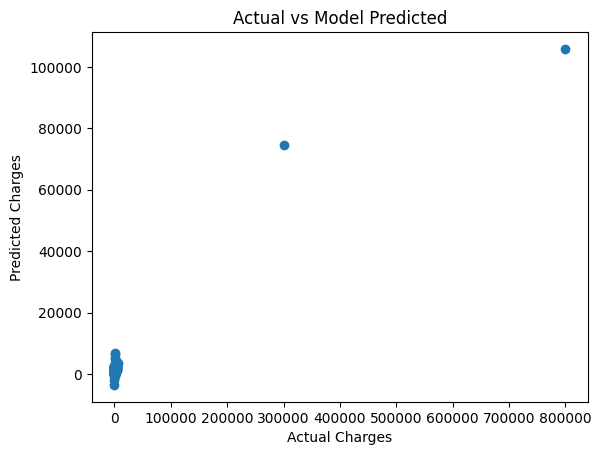

In [90]:
plt.scatter(y_test,y_pred)
plt.xlabel('Actual Charges')
plt.ylabel('Predicted Charges')
plt.title('Actual vs Model Predicted')
plt.show()

In [91]:
# Model Evaluation: MAE , MSE , RMSE

from sklearn.metrics import mean_absolute_error,mean_squared_error

mean_absolute_error(y_test,y_pred) # 4 % error

862.0922937749209

In [92]:
mean_squared_error(y_test,y_pred) # lesser the better

279138976.4747351

In [93]:
np.sqrt(mean_squared_error(y_test,y_pred))

16707.452722504862

In [94]:
print("Score: ", rm.score(x_test, y_test))

Score:  0.26805032092251124


In [95]:
from sklearn.linear_model import Ridge, Lasso, RidgeCV, LassoCV

lassocv = LassoCV(alphas=None, max_iter=100)
lassocv.fit(x_train, y_train)


LassoCV(max_iter=100)

In [96]:
# Best alpha parameter
alpha = lassocv.alpha_ # Best alpha rate
alpha

17.665761782287447

In [97]:
# Now since we have the best parameter, lasso regression will be used:
lasso_reg = Lasso(alpha)
lasso_reg.fit(x_train,y_train)
# i.e. when model is training it will learn at this speed 6....

Lasso(alpha=17.665761782287447)

In [98]:
lasso_reg.score(x_test,y_test)

0.49123916345920027

In [99]:
from sklearn.linear_model import Ridge, RidgeCV

ridgecv = RidgeCV(alphas=np.arange(0.001, 0.1, 0.01))
ridgecv.fit(x_train, y_train)


RidgeCV(alphas=array([0.001, 0.011, 0.021, 0.031, 0.041, 0.051, 0.061, 0.071, 0.081,
       0.091]))

In [100]:
ridgecv.alpha_ # Best alpha rate

0.09099999999999998

In [101]:
ridge_model = Ridge(alpha = ridgecv.alpha_)
ridge_model.fit(x_train,y_train)

Ridge(alpha=0.09099999999999998)

In [102]:
ridge_model.score(x_test,y_test)

0.2687854793160741

In [103]:
#model performance

print("MAE: ", metrics.mean_absolute_error(y_test, y_pred))
print("MSE: ", metrics.mean_squared_error(y_test, y_pred))
print("RMSE: ", metrics.mean_squared_error(y_test, y_pred, squared=False))
print("R2: ", metrics.r2_score(y_test, y_pred), "\n")
print("Score: ", rm.score(x_test, y_test))

MAE:  862.0922937749209
MSE:  279138976.4747351
RMSE:  16707.452722504862
R2:  0.26805032092251124 

Score:  0.26805032092251124


In [104]:
print(rm.coef_)
print(f"{rm.intercept_:.2f}")

[-4.73057815e-09  1.33058009e-11 -2.23288055e-11 ... -2.80904553e+01
 -6.20077949e+00  5.46693672e+01]
1143.41


In [105]:
# Using decision tree:

from sklearn.tree import DecisionTreeRegressor

model = DecisionTreeRegressor()

model.fit(x_train, y_train)

y_preddt = model.predict(x_test)

r2_score(y_test,y_preddt)

0.5810459993451805

In [106]:
# Random forest:

from sklearn.ensemble import RandomForestRegressor
regressor_rf = RandomForestRegressor(n_estimators = 100)

regressor_rf.fit(x_train, y_train)

lr_normal_rf = regressor_rf.score(x_train, y_train)

lr_normal_rf

0.957681532657649

In [107]:
y_predrf = regressor_rf.predict(x_test)

lr_normal_rf_test = regressor_rf.score(x_test, y_test)

lr_normal_rf_test

mse_lr_normal_rf  = mean_absolute_error(y_test, y_predrf)

mse_lr_normal_rf

552.700057561486

In [108]:
# Model Evaluation: MAE , MSE , RMSE

from sklearn.metrics import mean_absolute_error,mean_squared_error

print("MAE: ", metrics.mean_absolute_error(y_test, y_predrf))
print("MSE: ", metrics.mean_squared_error(y_test, y_predrf))
print("RMSE: ", metrics.mean_squared_error(y_test, y_predrf, squared=False))
print("R2: ", metrics.r2_score(y_test, y_predrf), "\n")
print("Score: ", regressor_rf.score(x_test, y_predrf))

MAE:  552.700057561486
MSE:  184744072.24718416
RMSE:  13592.05916140686
R2:  0.5155697491602935 

Score:  1.0


In [ ]:
# Using Support vector regressor:

# Fit the model over the training data
from sklearn.svm import SVR
svr = SVR()
svr.fit(x_train, y_train)

y_predsvr = svr.predict(x_test)

r2_score(y_test,y_predsvr)